# Image Classification with CNNs

## Task 1: Implement and Compare CNN Architectures

By Dechathon Niamsa-ard [st126235]

**Dataset Options:**

- [CIFAR-10]— 10 object classes (60,000 images)
- [Tiny ImageNet] — 200 object classes (64x64 images)

**Instructions:**

1. Implement and train **two CNN architectures** using `Pytorch`:
- A simple baseline (e.g., custom CNN or LeNet)
- A modern deep model (e.g., VGG, ResNet, or MobileNet (optional: use `transfer` learning)
2. Experiment with:
- Optimizers: **SGD vs Adam**
- Learning rate schedules (e.g., `StepLR`, `ReduceLROnPlateau`)
3. Visualize:
- Training and validation accuracy/loss curves
- Confusion matrix
- Example misclassified images
- Example activation maps from CNN layer1 and layer2 of each model.

**Deliverables:**

- Notebook with model training and evaluation
- Plots and visualizations
- Short discussion comparing performance and convergence behavior

---

## Import necessary Libraries

In [1]:
# Import the necessary libraries for this assignment
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
import torchvision
from torchvision import datasets, models,transforms
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import time
import os
import copy
from typing import List, Tuple

## Setup Config Variable

In [2]:
EPOCHS = 20
BATCH_SIZE = 128


## Make sure the torch is using GPU

In [3]:
!nvidia-smi

Fri Oct 31 01:46:29 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.88                 Driver Version: 580.88         CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 5060 Ti   WDDM  |   00000000:02:00.0  On |                  N/A |
|  0%   33C    P8              4W /  180W |    5949MiB /  16311MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
# Check if GPU is available and set device accordingly
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Using device: {device}')

Using device: cuda


## Download Dataset: CIFAR-10

In [5]:
# Download the CIFAR-10 dataset without transformation first
trainset_base = datasets.CIFAR10(root='./data', train=True, download=True, transform=None)
testset_base = datasets.CIFAR10(root='./data', train=False, download=True, transform=None)

# Split the base training set into train and validation sets using a fixed random seed for reproducibility
from torch.utils.data import Subset
import numpy as np

# Set seed for reproducible split
np.random.seed(42)
torch.manual_seed(42)

# Create indices for train/val split
indices = list(range(len(trainset_base)))
np.random.shuffle(indices)
train_indices = indices[:45000]
val_indices = indices[45000:]

# Define transform for 32x32 images (for custom CNN)
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
])

# Define transform for 224x224 images (for ResNet)
transform_resnet = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2470, 0.2435, 0.2616))
])

# Create datasets with 32x32 transform using the same train/val indices
trainset_base_32 = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainset = Subset(trainset_base_32, train_indices)
valset = Subset(trainset_base_32, val_indices)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
valloader = torch.utils.data.DataLoader(valset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
testset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

# Create datasets with 224x224 transform using the same train/val indices
trainset_base_224 = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_resnet)
trainset_resnet = Subset(trainset_base_224, train_indices)
valset_resnet = Subset(trainset_base_224, val_indices)
trainloader_resnet = torch.utils.data.DataLoader(trainset_resnet, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
valloader_resnet = torch.utils.data.DataLoader(valset_resnet, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
testset_resnet = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform_resnet)
testloader_resnet = torch.utils.data.DataLoader(testset_resnet, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

100%|██████████| 170M/170M [00:17<00:00, 9.83MB/s] 


In [6]:
# Check the sizes of the datasets
print(f'Training set size: {len(trainset)}')
print(f'Validation set size: {len(valset)}')
print(f'Test set size: {len(testset)}')

Training set size: 45000
Validation set size: 5000
Test set size: 10000


## Create a Simple Baseline custom CNN Structure

In [7]:
class customCNN(nn.Module):
    def __init__(self, num_classes: int = 10):
        super(customCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0)
        self.fc1 = nn.Linear(128 * 4 * 4, 512)
        self.fc2 = nn.Linear(512, num_classes)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(-1, 128 * 4 * 4)
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = self.fc2(x)
        return x

In [8]:
exaple_model = customCNN()
print(exaple_model)

customCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=2048, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=10, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)


## Create a Modern Deep Learning Model (with Transfer Learning)

In [9]:
# Define a function to Download a pre-trained ResNet18 model and modify it for CIFAR-10 for transfer learning
def get_resnet18_model(device: torch.device) -> nn.Module:
    model_ft = models.resnet18(pretrained=True)
    # Freeze all layers
    for param in model_ft.parameters():
        param.requires_grad = False
    
    # Modify the final layer to match CIFAR-10 classes
    num_ftrs = model_ft.fc.in_features
    model_ft.fc = nn.Linear(num_ftrs, 10) # CIFAR-10 has 10 classes
    return model_ft.to(device)

## Experiment: Optimizer and Learning Rate Scheduler

In [10]:
def train_model(model, data_loaders, criterion, optimizer, scheduler, num_epochs=EPOCHS):
    since = time.time()

    history = {'train_loss': [], 'train_acc': [],
               'val_loss': [], 'val_acc': [], 'learning_rate': []}
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        epoch_start = time.time()
        print(f'Epoch {epoch + 1}/{num_epochs}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in data_loaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(data_loaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(data_loaders[phase].dataset)

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # deep copy the model
            if phase == 'val':
                history['val_loss'].append(epoch_loss)
                history['val_acc'].append(epoch_acc.item())
                if scheduler:
                    if isinstance(scheduler, lr_scheduler.ReduceLROnPlateau):
                        scheduler.step(epoch_loss)
                    else:
                        scheduler.step()
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = copy.deepcopy(model.state_dict())
            else:
                history['train_loss'].append(epoch_loss)
                history['train_acc'].append(epoch_acc.item())
                history['learning_rate'].append(optimizer.param_groups[0]['lr'])
        epoch_end = time.time()
        print(f'Epoch completed in {(epoch_end - epoch_start)//60:.0f}m {(epoch_end - epoch_start)%60:.0f}s\n')
    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')
    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, history

In [11]:
def plot_curves(history, title):
    """Plots training and validation loss/accuracy curves."""
    plt.figure(figsize=(24, 15))
    plt.suptitle(title, fontsize=16)

    plt.subplot(3, 1, 1)
    plt.plot(history['train_loss'], label='Training Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(3, 1, 2)
    plt.plot(history['val_acc'], label='Validation Accuracy', color='orange')
    plt.plot(history['train_acc'], label='Training Accuracy', color='green')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.grid(True)

    plt.subplot(3, 1, 3)
    plt.plot(history['learning_rate'], label='Learning Rate', color='red')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.legend()
    plt.grid(True)
    
    plt.show()

def plot_confusion_matrix(model, title, test_loader=None):
    """Computes and plots the confusion matrix."""
    if test_loader is None:
        test_loader = testloader
    y_pred, y_true = [], []
    model.eval()
    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs.to(device))
            _, predicted = torch.max(outputs, 1)
            y_pred.extend(predicted.cpu().numpy())
            y_true.extend(labels.cpu().numpy())
            
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.title(f'Confusion Matrix - {title}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

def plot_misclassified_images(model, title, test_loader=None, test_dataset=None):
    """Plots a few examples of misclassified images."""
    if test_loader is None:
        test_loader = testloader
    if test_dataset is None:
        test_dataset = testset
    model.eval()
    misclassified_images = []
    misclassified_labels = []
    with torch.no_grad():
        for inputs, labels in test_loader:
            if len(misclassified_images) >= 10:
                break
            outputs = model(inputs.to(device))
            _, predicted = torch.max(outputs, 1)
            
            errors = (predicted != labels.to(device))
            for i in range(inputs.size(0)):
                if errors[i]:
                    img = inputs[i].cpu()
                    true_label = classes[labels[i]]
                    pred_label = classes[predicted[i]]
                    
                    # Un-normalize for display
                    img = img / 2 + 0.5
                    misclassified_images.append(img)
                    misclassified_labels.append(f'True: {true_label}\nPred: {pred_label}')
                    if len(misclassified_images) >= 10:
                        break

    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    fig.suptitle(f'Example Misclassified Images - {title}', fontsize=16)
    for i, ax in enumerate(axes.flat):
        if i < len(misclassified_images):
            ax.imshow(np.transpose(misclassified_images[i].numpy(), (1, 2, 0)))
            ax.set_title(misclassified_labels[i])
            ax.axis('off')
    plt.show()

def plot_activation_maps(model, layer, title, test_dataset=None):
    """Visualizes the feature maps from a specific convolutional layer."""
    if test_dataset is None:
        test_dataset = testset
    model.eval()
    
    # Get a single image from the test set
    img, _ = test_dataset[5] # Take the 6th image as an example
    img_tensor = img.unsqueeze(0).to(device)

    # Use a forward hook to capture the layer's output
    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook

    # Register the hook on the desired layer
    hook_handle = layer.register_forward_hook(get_activation('feat_maps'))
    
    # Forward pass to trigger the hook
    _ = model(img_tensor)
    
    # Remove the hook
    hook_handle.remove()
    
    # Get the activation maps
    feat_maps = activation['feat_maps'].squeeze(0)
    
    # Plot the first 16 feature maps
    num_maps = min(feat_maps.size(0), 16)
    fig, axes = plt.subplots(num_maps // 4, 4, figsize=(10, 10))
    fig.suptitle(f'Activation Maps from {layer.__class__.__name__} - {title}', fontsize=16)
    for i in range(num_maps):
        ax = axes[i // 4, i % 4]
        ax.imshow(feat_maps[i].cpu().numpy(), cmap='viridis')
        ax.axis('off')
    plt.show()

In [12]:
# Define data loaders dictionary for custom CNN (32x32 images)
data_loaders = {
    'train': trainloader,
    'val': valloader
}

# Define data loaders dictionary for ResNet (224x224 images)
data_loaders_resnet = {
    'train': trainloader_resnet,
    'val': valloader_resnet
}

In [13]:
# Define classes
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

### 1. Custom CNN + SGD + No Learning Rate Schedule

In [14]:
model_1 = customCNN().to(device)
optimizer_1 = optim.SGD(model_1.parameters(), lr=0.001)
scheduler_1 = None

# Train and evaluate the model using the defined function
model_1, history_1 = train_model(model_1, data_loaders, nn.CrossEntropyLoss(), optimizer_1, scheduler_1, num_epochs=EPOCHS)

Epoch 1/20
----------
train Loss: 2.3015 Acc: 0.1182
val Loss: 2.2976 Acc: 0.1588
Epoch completed in 0m 13s

Epoch 2/20
----------
train Loss: 2.2945 Acc: 0.1423
val Loss: 2.2913 Acc: 0.1674
Epoch completed in 0m 12s

Epoch 3/20
----------
train Loss: 2.2878 Acc: 0.1474
val Loss: 2.2841 Acc: 0.1646
Epoch completed in 0m 13s

Epoch 4/20
----------
train Loss: 2.2795 Acc: 0.1566
val Loss: 2.2746 Acc: 0.1708
Epoch completed in 0m 12s

Epoch 5/20
----------
train Loss: 2.2683 Acc: 0.1682
val Loss: 2.2605 Acc: 0.1936
Epoch completed in 0m 13s

Epoch 6/20
----------
train Loss: 2.2523 Acc: 0.1816
val Loss: 2.2398 Acc: 0.2076
Epoch completed in 0m 13s

Epoch 7/20
----------
train Loss: 2.2276 Acc: 0.2007
val Loss: 2.2077 Acc: 0.2360
Epoch completed in 0m 12s

Epoch 8/20
----------
train Loss: 2.1924 Acc: 0.2159
val Loss: 2.1631 Acc: 0.2576
Epoch completed in 0m 12s

Epoch 9/20
----------
train Loss: 2.1527 Acc: 0.2312
val Loss: 2.1171 Acc: 0.2688
Epoch completed in 0m 12s

Epoch 10/20
-------

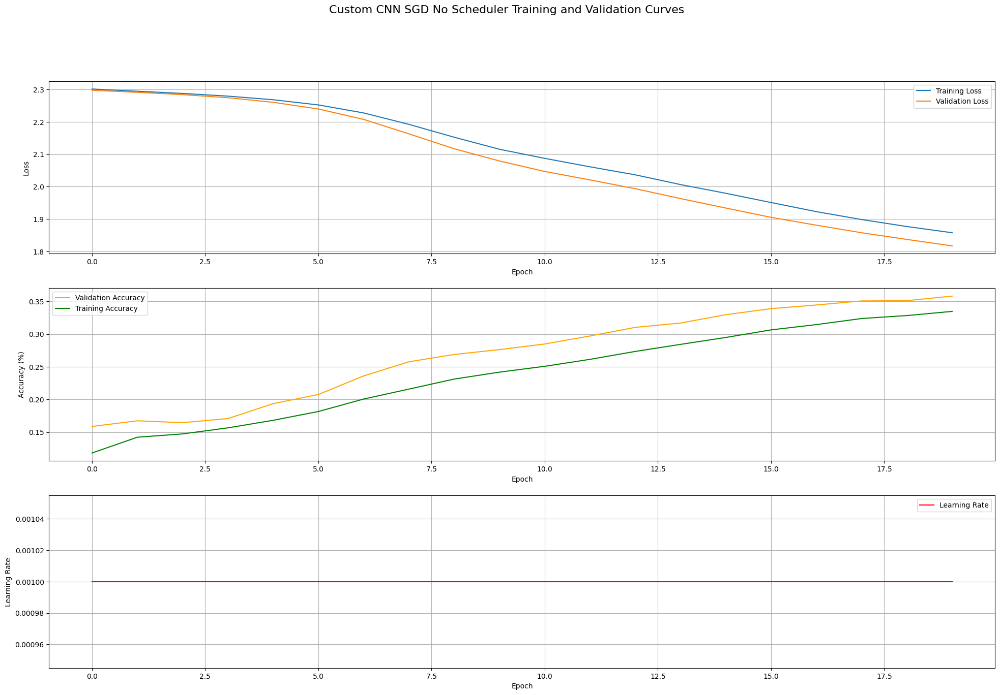

In [15]:
# Visualize training results for model_1
plot_curves(history_1, title='Custom CNN SGD No Scheduler Training and Validation Curves')


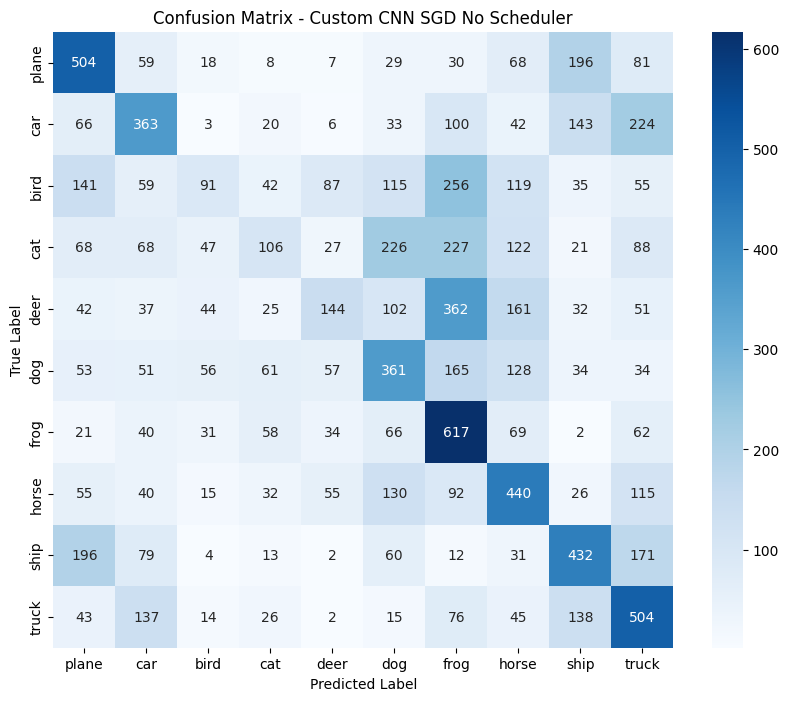

In [16]:
# Plot confusion matrix for model_1
plot_confusion_matrix(model_1, title='Custom CNN SGD No Scheduler')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22441113..1.4005105].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4391681..1.2814069].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48679847..1.557913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.36130375..1.5310344].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3290937..1.5279315].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.41767126..1.1405733].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.494

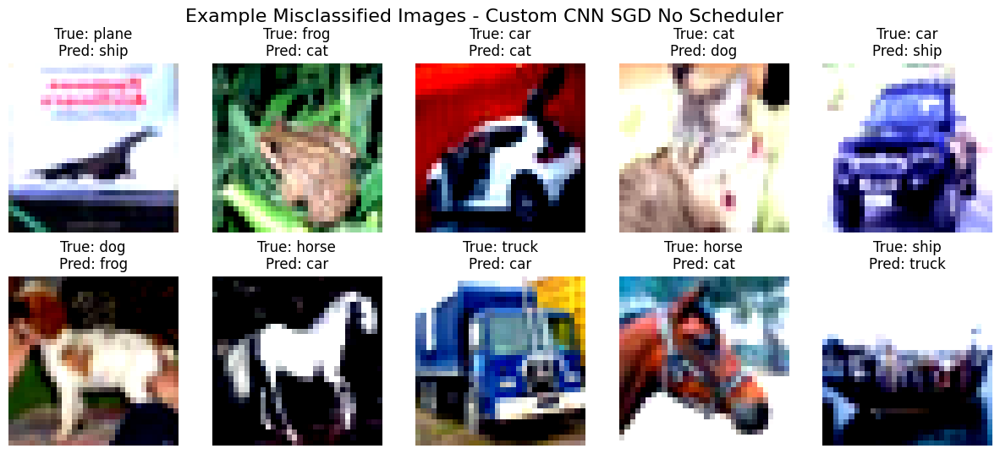

In [17]:
# Plot misclassified images for model_1
plot_misclassified_images(model_1, title='Custom CNN SGD No Scheduler')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


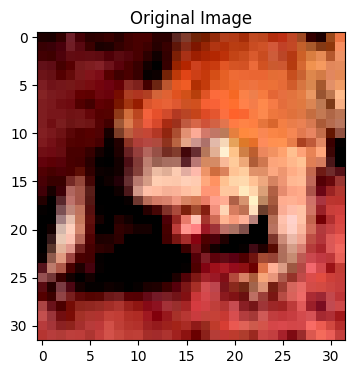

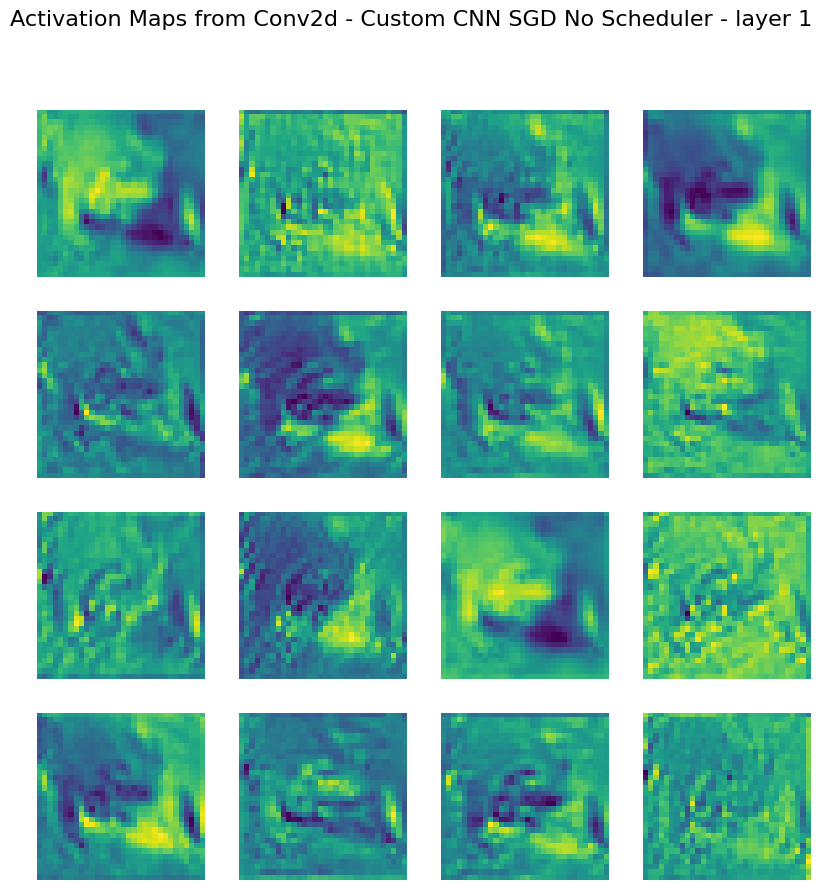

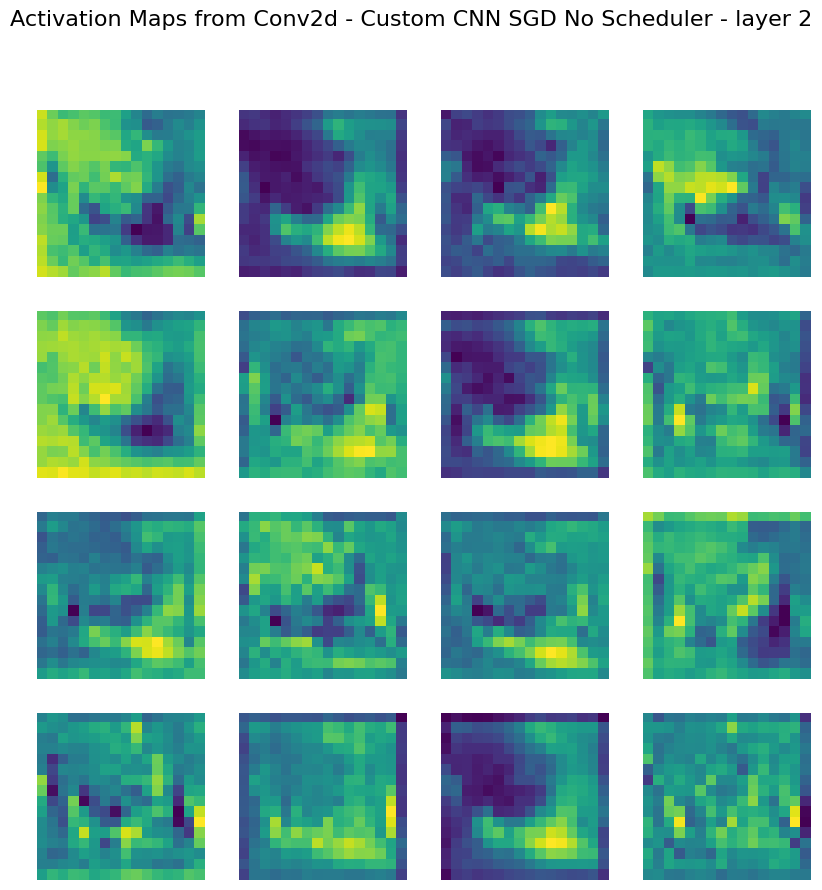

In [18]:
# Plot activation maps from the first two convolutional layer of model_1 comparing to original image
original_img, _ = testset[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_1, model_1.conv1, title='Custom CNN SGD No Scheduler - layer 1')
plot_activation_maps(model_1, model_1.conv2, title='Custom CNN SGD No Scheduler - layer 2')

In [19]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_1.eval()
with torch.no_grad():
    for inputs, labels in testloader:
        outputs = model_1(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.42      0.51      0.46      1000
         car       0.39      0.36      0.38      1000
        bird       0.27      0.09      0.13      1000
         cat       0.27      0.11      0.15      1000
        deer       0.34      0.14      0.20      1000
         dog       0.31      0.36      0.33      1000
        frog       0.32      0.62      0.42      1000
       horse       0.36      0.44      0.40      1000
        ship       0.41      0.43      0.42      1000
       truck       0.37      0.51      0.43      1000

    accuracy                           0.36     10000
   macro avg       0.35      0.36      0.33     10000
weighted avg       0.35      0.36      0.33     10000



In [20]:
model_1_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

print(model_1_eval)

{'accuracy': 0.3559, 'precision': 0.34620977924798907, 'recall': 0.3559, 'f1_score': 0.3319262983304971}


In [21]:
# Save the trained model
torch.save(model_1.state_dict(), './model_task1/custom_cnn_1.pth')

### 2. Custom CNN + SGD + StepLR

In [22]:
model_2 = customCNN().to(device)
optimizer_2 = optim.SGD(model_2.parameters(), lr=0.001)
scheduler_2 = lr_scheduler.StepLR(optimizer_2, step_size=7, gamma=0.1)

# Train and evaluate the model using the defined function
model_2, history_2 = train_model(model_2, data_loaders, nn.CrossEntropyLoss(), optimizer_2, scheduler_2, num_epochs=EPOCHS)

Epoch 1/20
----------
train Loss: 2.2992 Acc: 0.1337
val Loss: 2.2961 Acc: 0.1606
Epoch completed in 0m 12s

Epoch 2/20
----------
train Loss: 2.2934 Acc: 0.1533
val Loss: 2.2904 Acc: 0.1740
Epoch completed in 0m 12s

Epoch 3/20
----------
train Loss: 2.2871 Acc: 0.1618
val Loss: 2.2835 Acc: 0.1704
Epoch completed in 0m 11s

Epoch 4/20
----------
train Loss: 2.2791 Acc: 0.1674
val Loss: 2.2743 Acc: 0.1734
Epoch completed in 0m 11s

Epoch 5/20
----------
train Loss: 2.2685 Acc: 0.1716
val Loss: 2.2616 Acc: 0.1770
Epoch completed in 0m 11s

Epoch 6/20
----------
train Loss: 2.2534 Acc: 0.1828
val Loss: 2.2432 Acc: 0.1898
Epoch completed in 0m 11s

Epoch 7/20
----------
train Loss: 2.2331 Acc: 0.1961
val Loss: 2.2185 Acc: 0.2162
Epoch completed in 0m 11s

Epoch 8/20
----------
train Loss: 2.2200 Acc: 0.2052
val Loss: 2.2155 Acc: 0.2182
Epoch completed in 0m 11s

Epoch 9/20
----------
train Loss: 2.2169 Acc: 0.2080
val Loss: 2.2125 Acc: 0.2164
Epoch completed in 0m 12s

Epoch 10/20
-------

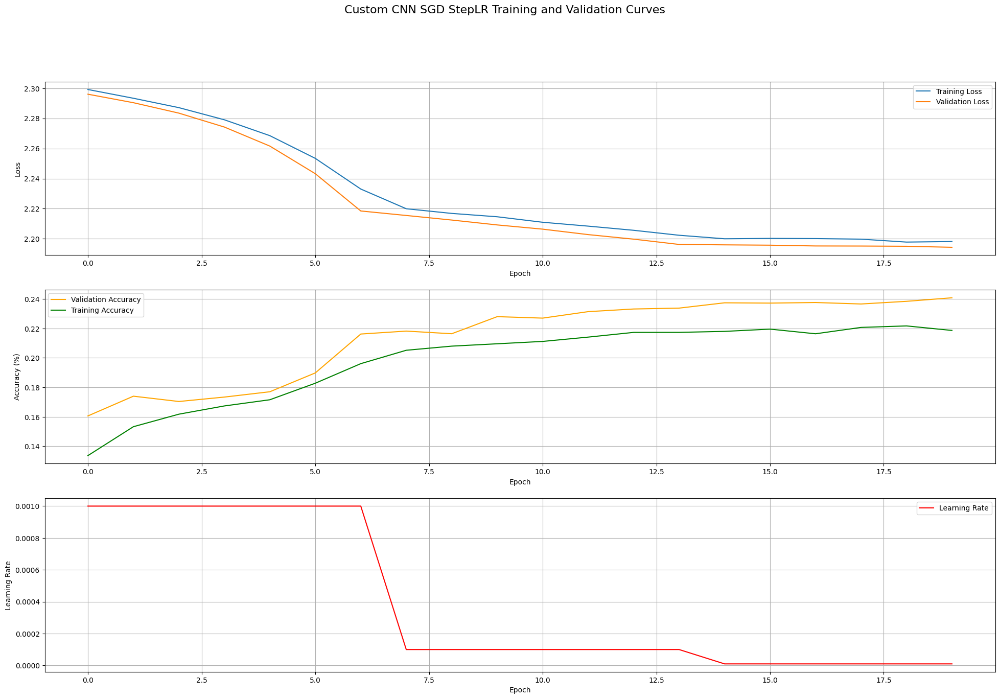

In [23]:
# Visualize training results for model_2
plot_curves(history_2, title='Custom CNN SGD StepLR Training and Validation Curves')

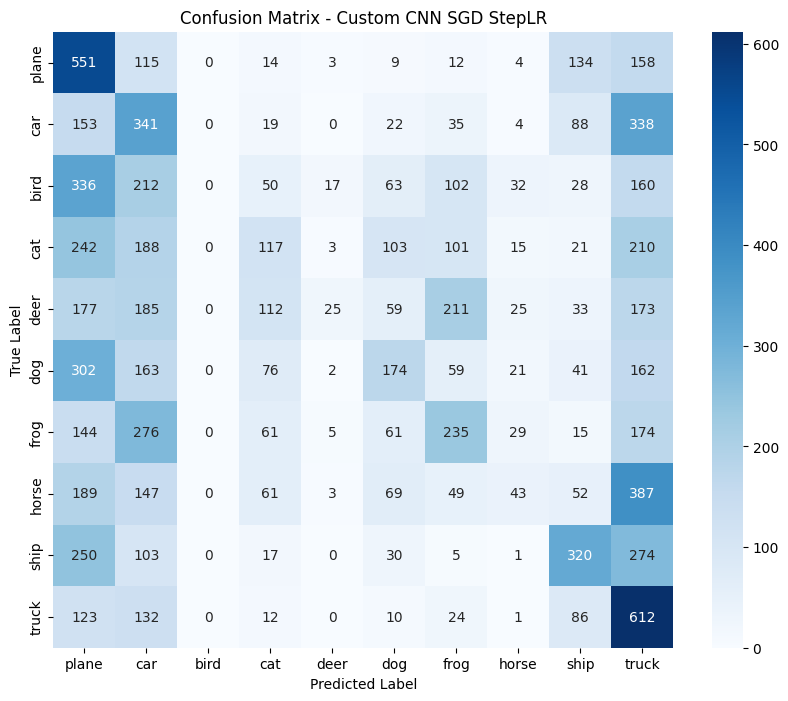

In [24]:
# Plot confusion matrix for model_2
plot_confusion_matrix(model_2, title='Custom CNN SGD StepLR')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.39153773..1.5471393].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4629833..1.5354269].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22441113..1.4005105].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4391681..1.2814069].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32803053..1.555192].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.361

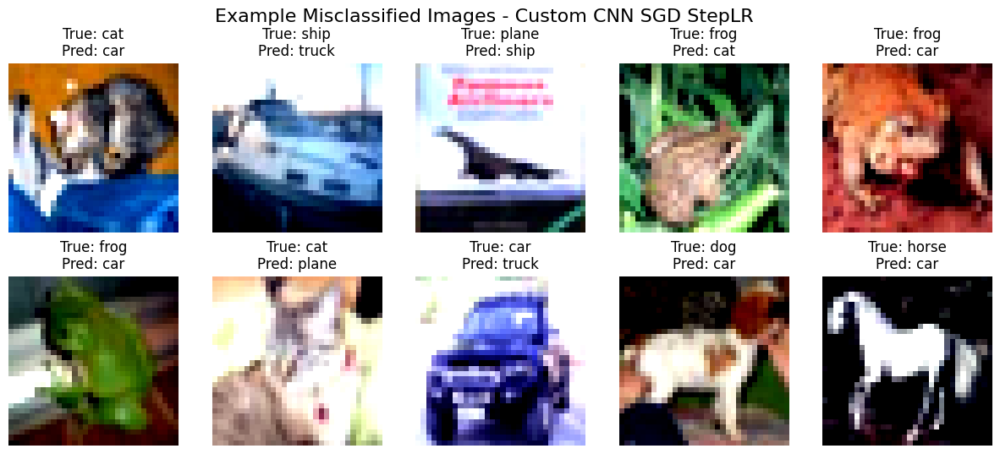

In [25]:
 # Plot misclassified images for model_2
plot_misclassified_images(model_2, title='Custom CNN SGD StepLR')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


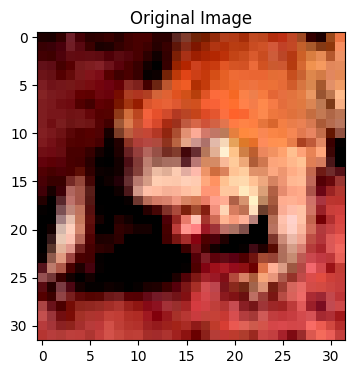

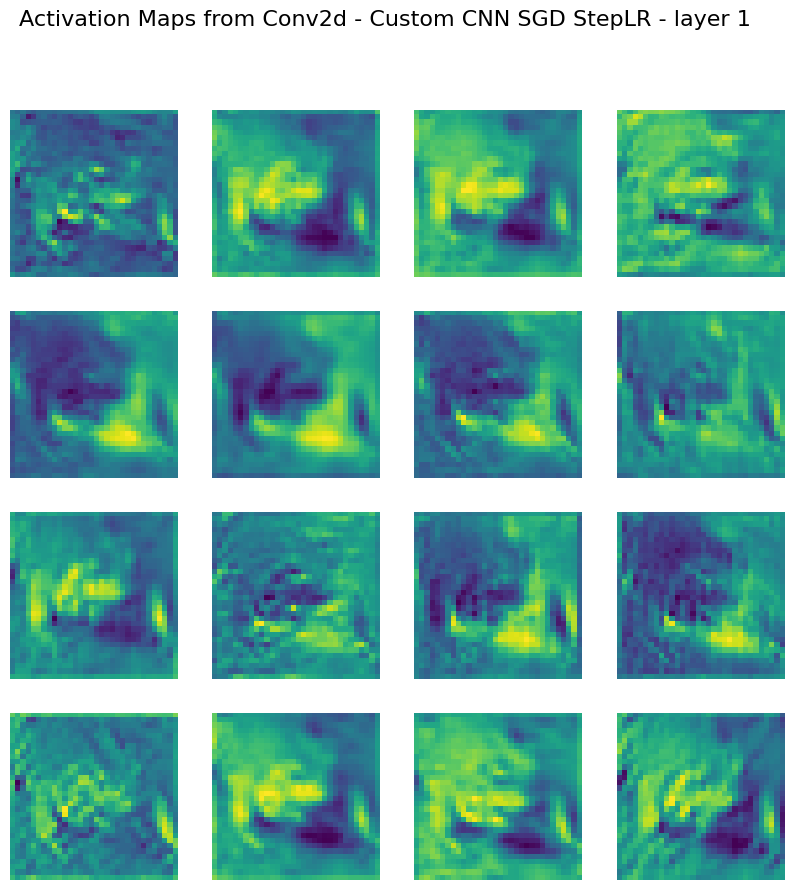

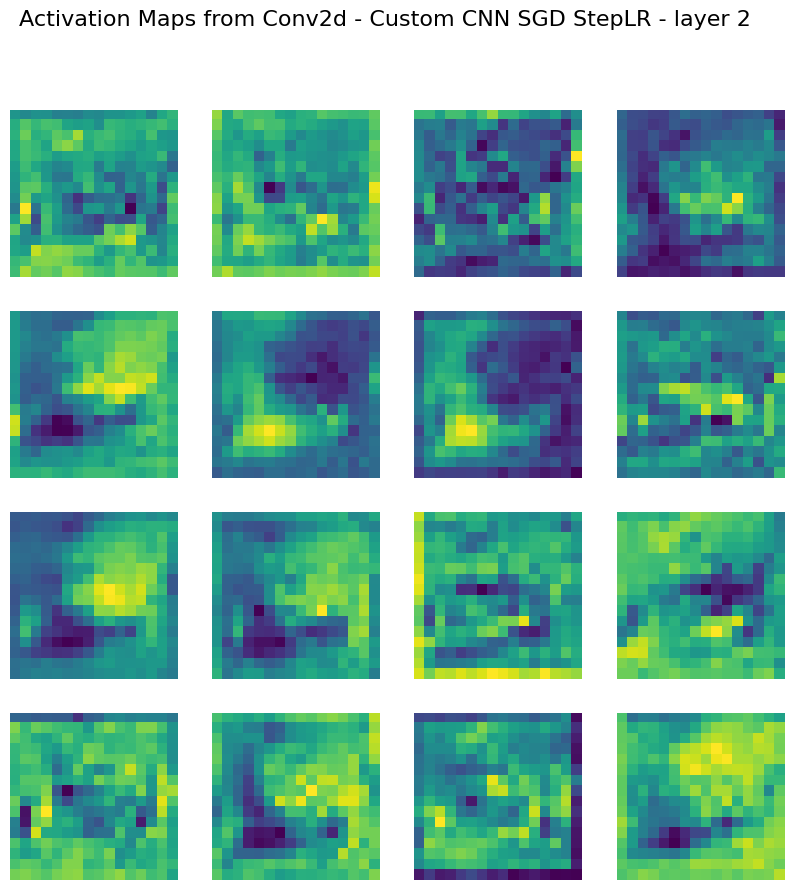

In [26]:
# Plot activation maps from the first two convolutional layer of model_2 comparing to original image
original_img, _ = testset[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_2, model_2.conv1, title='Custom CNN SGD StepLR - layer 1')
plot_activation_maps(model_2, model_2.conv2, title='Custom CNN SGD StepLR - layer 2')

In [27]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_2.eval()
with torch.no_grad():
    for inputs, labels in testloader:
        outputs = model_2(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.23      0.55      0.32      1000
         car       0.18      0.33      0.24      1000
        bird       0.00      0.00      0.00      1000
         cat       0.20      0.12      0.15      1000
        deer       0.46      0.03      0.05      1000
         dog       0.29      0.17      0.21      1000
        frog       0.28      0.24      0.26      1000
       horse       0.23      0.04      0.07      1000
        ship       0.39      0.32      0.35      1000
       truck       0.23      0.62      0.34      1000

    accuracy                           0.24     10000
   macro avg       0.25      0.24      0.20     10000
weighted avg       0.25      0.24      0.20     10000



c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.c

In [28]:
model_2_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


In [29]:
print(model_2_eval)

{'accuracy': 0.2409, 'precision': 0.24965244032892286, 'recall': 0.2409, 'f1_score': 0.19740235406381354}


In [30]:
# Save the trained model
torch.save(model_2.state_dict(), './model_task1/custom_cnn_2.pth')


### 3. Custom CNN + SGD + ReduceLROnPlateau

In [31]:
model_3 = customCNN().to(device)
optimizer_3 = optim.SGD(model_3.parameters(), lr=0.001)
scheduler_3 = lr_scheduler.ReduceLROnPlateau(optimizer_3, 'min', patience=3)

# Train and evaluate the model using the defined function
model_3, history_3 = train_model(model_3, data_loaders, nn.CrossEntropyLoss(), optimizer_3, scheduler_3, num_epochs=EPOCHS)

Epoch 1/20
----------
train Loss: 2.3011 Acc: 0.1064
val Loss: 2.2989 Acc: 0.1120
Epoch completed in 0m 11s

Epoch 2/20
----------
train Loss: 2.2977 Acc: 0.1188
val Loss: 2.2956 Acc: 0.1242
Epoch completed in 0m 11s

Epoch 3/20
----------
train Loss: 2.2942 Acc: 0.1325
val Loss: 2.2920 Acc: 0.1580
Epoch completed in 0m 11s

Epoch 4/20
----------
train Loss: 2.2900 Acc: 0.1445
val Loss: 2.2878 Acc: 0.1730
Epoch completed in 0m 11s

Epoch 5/20
----------
train Loss: 2.2851 Acc: 0.1520
val Loss: 2.2824 Acc: 0.1702
Epoch completed in 0m 11s

Epoch 6/20
----------
train Loss: 2.2789 Acc: 0.1578
val Loss: 2.2753 Acc: 0.1686
Epoch completed in 0m 11s

Epoch 7/20
----------
train Loss: 2.2707 Acc: 0.1695
val Loss: 2.2659 Acc: 0.1692
Epoch completed in 0m 11s

Epoch 8/20
----------
train Loss: 2.2591 Acc: 0.1791
val Loss: 2.2515 Acc: 0.1886
Epoch completed in 0m 11s

Epoch 9/20
----------
train Loss: 2.2421 Acc: 0.1959
val Loss: 2.2299 Acc: 0.2096
Epoch completed in 0m 11s

Epoch 10/20
-------

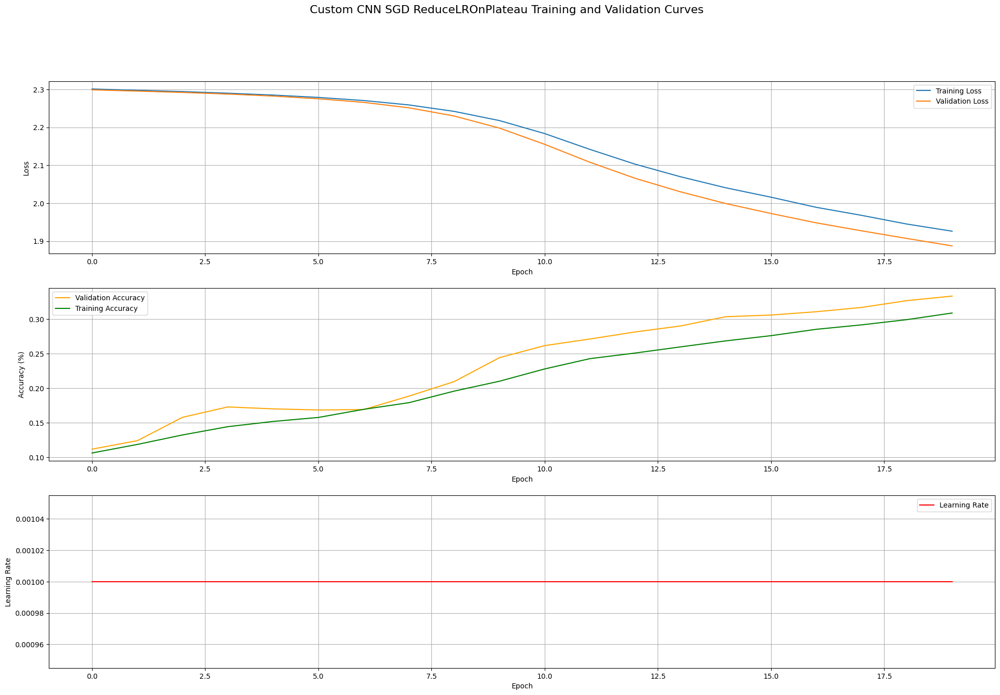

In [32]:
# Visualize training results for model_3
plot_curves(history_3, title='Custom CNN SGD ReduceLROnPlateau Training and Validation Curves')

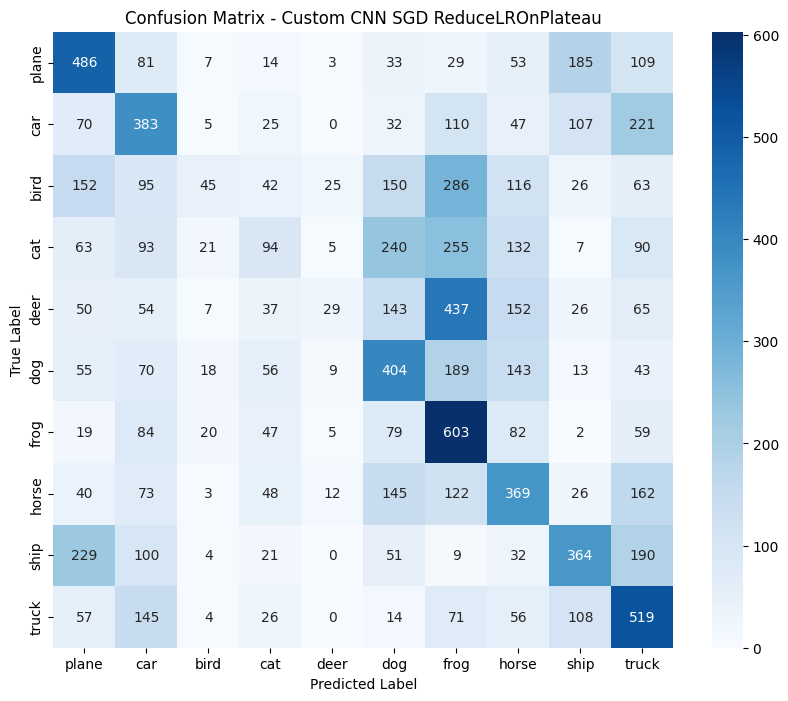

In [33]:
# Plot confusion matrix for model_3
plot_confusion_matrix(model_3, title='Custom CNN SGD ReduceLROnPlateau')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.39153773..1.5471393].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22441113..1.4005105].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4391681..1.2814069].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48679847..1.557913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.36130375..1.5310344].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3290937..1.5279315].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.417

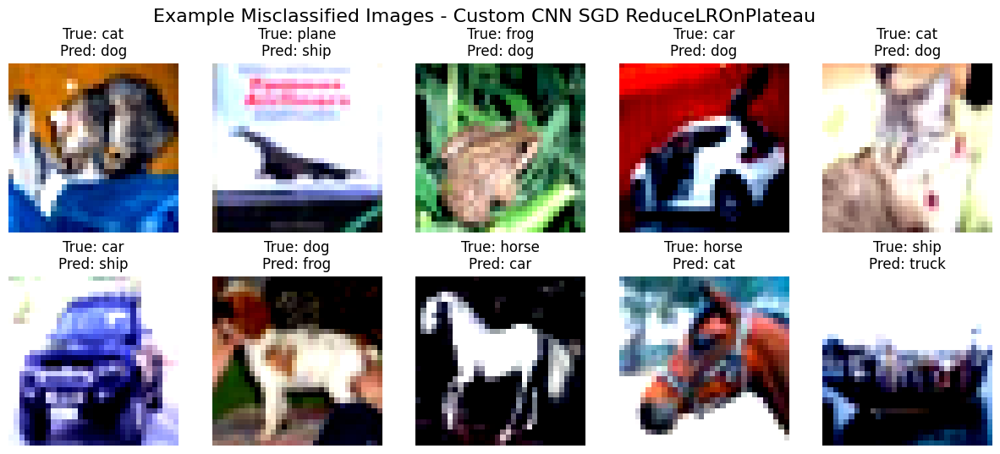

In [34]:
 # Plot misclassified images for model_3
plot_misclassified_images(model_3, title='Custom CNN SGD ReduceLROnPlateau')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


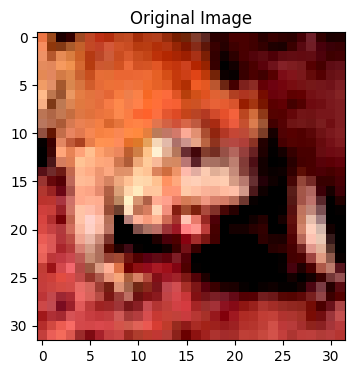

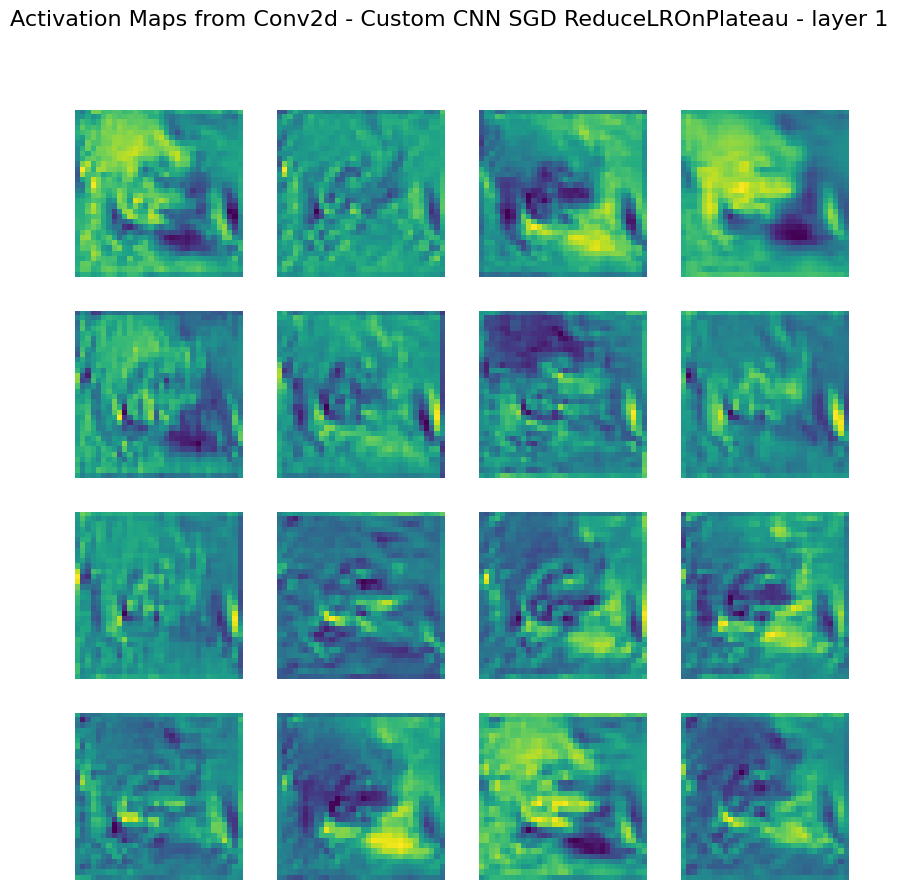

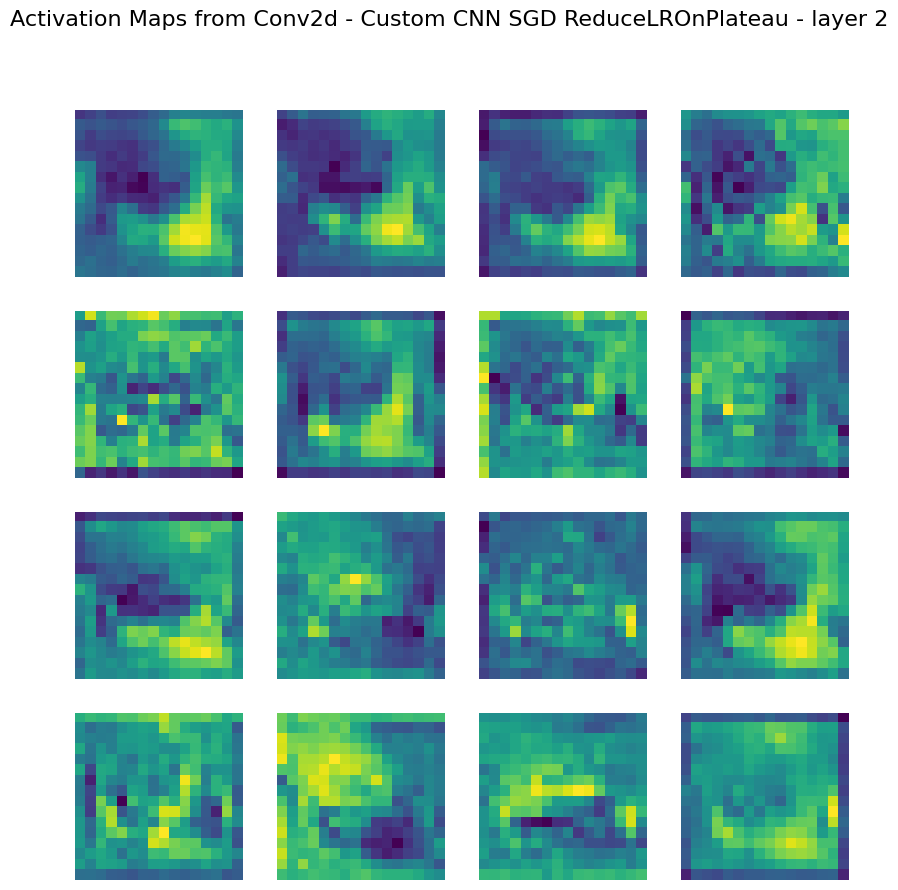

In [35]:
# Plot activation maps from the first two convolutional layer of model_3 comparing to original image
original_img, _ = testset[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_3, model_3.conv1, title='Custom CNN SGD ReduceLROnPlateau - layer 1')
plot_activation_maps(model_3, model_3.conv2, title='Custom CNN SGD ReduceLROnPlateau - layer 2')

In [36]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_3.eval()
with torch.no_grad():
    for inputs, labels in testloader:
        outputs = model_3(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.40      0.49      0.44      1000
         car       0.33      0.38      0.35      1000
        bird       0.32      0.04      0.08      1000
         cat       0.22      0.09      0.13      1000
        deer       0.31      0.03      0.05      1000
         dog       0.31      0.40      0.35      1000
        frog       0.29      0.60      0.39      1000
       horse       0.31      0.36      0.33      1000
        ship       0.42      0.36      0.39      1000
       truck       0.34      0.52      0.41      1000

    accuracy                           0.33     10000
   macro avg       0.32      0.33      0.29     10000
weighted avg       0.32      0.33      0.29     10000



In [37]:
model_3_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

In [38]:
print(model_3_eval)

{'accuracy': 0.3283, 'precision': 0.3244064392438768, 'recall': 0.3283, 'f1_score': 0.29244678965458476}


In [39]:
# Save the trained model
torch.save(model_3.state_dict(), './model_task1/custom_cnn_3.pth')


### 4. Custom CNN + Adam + No Learning Rate Schedule

In [40]:
model_4 = customCNN().to(device)
optimizer_4 = optim.Adam(model_4.parameters(), lr=0.001)
scheduler_4 = None

# Train and evaluate the model using the defined function
model_4, history_4 = train_model(model_4, data_loaders, nn.CrossEntropyLoss(), optimizer_4, scheduler_4, num_epochs=EPOCHS)

Epoch 1/20
----------
train Loss: 1.4990 Acc: 0.4533
val Loss: 1.1757 Acc: 0.5736
Epoch completed in 0m 12s

Epoch 2/20
----------
train Loss: 1.0879 Acc: 0.6130
val Loss: 0.9785 Acc: 0.6514
Epoch completed in 0m 11s

Epoch 3/20
----------
train Loss: 0.9132 Acc: 0.6788
val Loss: 0.8393 Acc: 0.6986
Epoch completed in 0m 11s

Epoch 4/20
----------
train Loss: 0.8030 Acc: 0.7177
val Loss: 0.7669 Acc: 0.7292
Epoch completed in 0m 11s

Epoch 5/20
----------
train Loss: 0.7276 Acc: 0.7440
val Loss: 0.7457 Acc: 0.7378
Epoch completed in 0m 12s

Epoch 6/20
----------
train Loss: 0.6698 Acc: 0.7666
val Loss: 0.6982 Acc: 0.7536
Epoch completed in 0m 11s

Epoch 7/20
----------
train Loss: 0.6166 Acc: 0.7863
val Loss: 0.6791 Acc: 0.7612
Epoch completed in 0m 11s

Epoch 8/20
----------
train Loss: 0.5782 Acc: 0.7976
val Loss: 0.6603 Acc: 0.7782
Epoch completed in 0m 11s

Epoch 9/20
----------
train Loss: 0.5362 Acc: 0.8116
val Loss: 0.6437 Acc: 0.7838
Epoch completed in 0m 11s

Epoch 10/20
-------

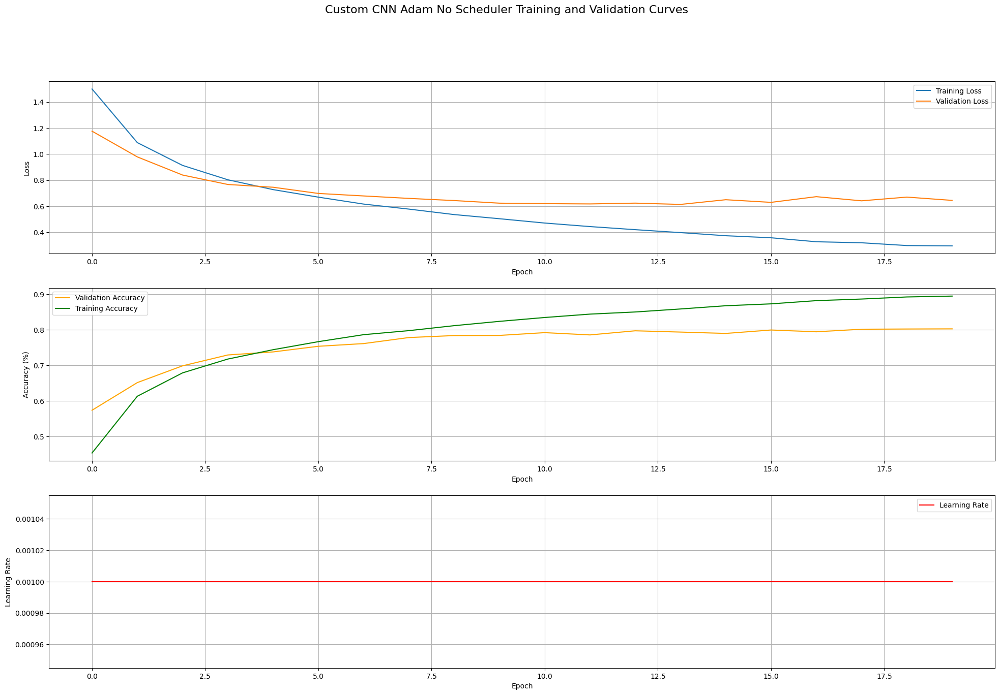

In [41]:
# Visualize training results for model_4
plot_curves(history_4, title='Custom CNN Adam No Scheduler Training and Validation Curves')

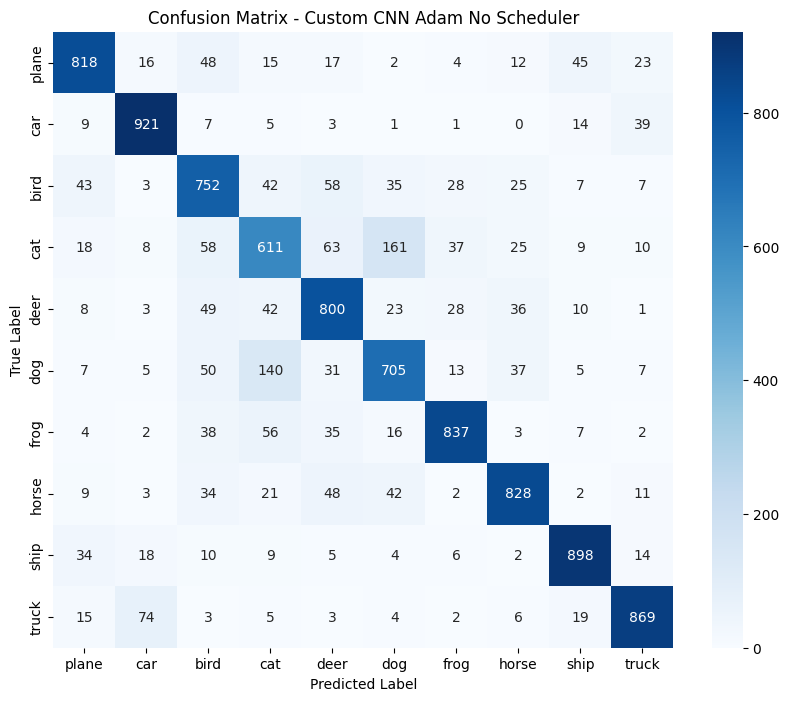

In [42]:
# Plot confusion matrix for model_4
plot_confusion_matrix(model_4, title='Custom CNN Adam No Scheduler')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48679847..1.557913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32803053..1.555192].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22483134..1.4660475].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49473685..1.4907719].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32009214..1.2358339].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49473685..1.4104787].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20

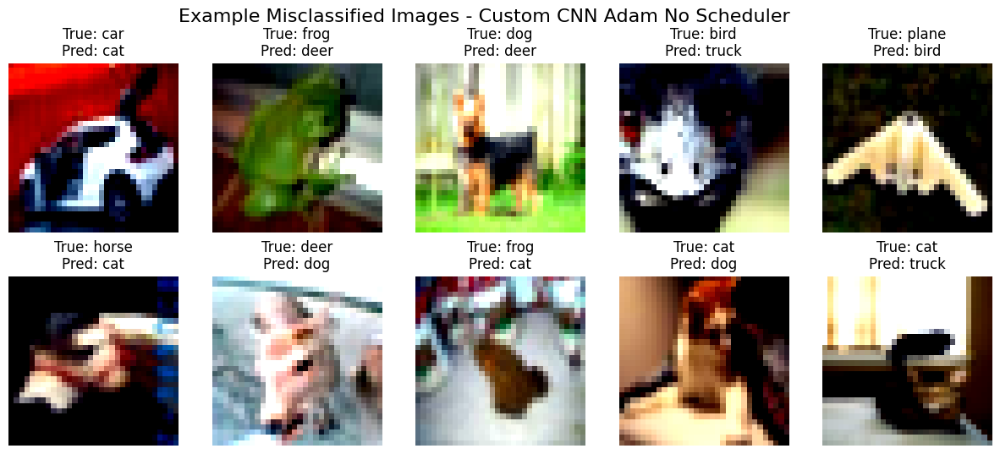

In [43]:
 # Plot misclassified images for model_4
plot_misclassified_images(model_4, title='Custom CNN Adam No Scheduler')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


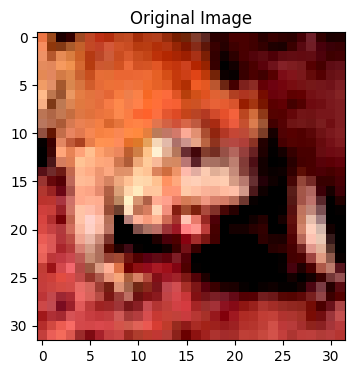

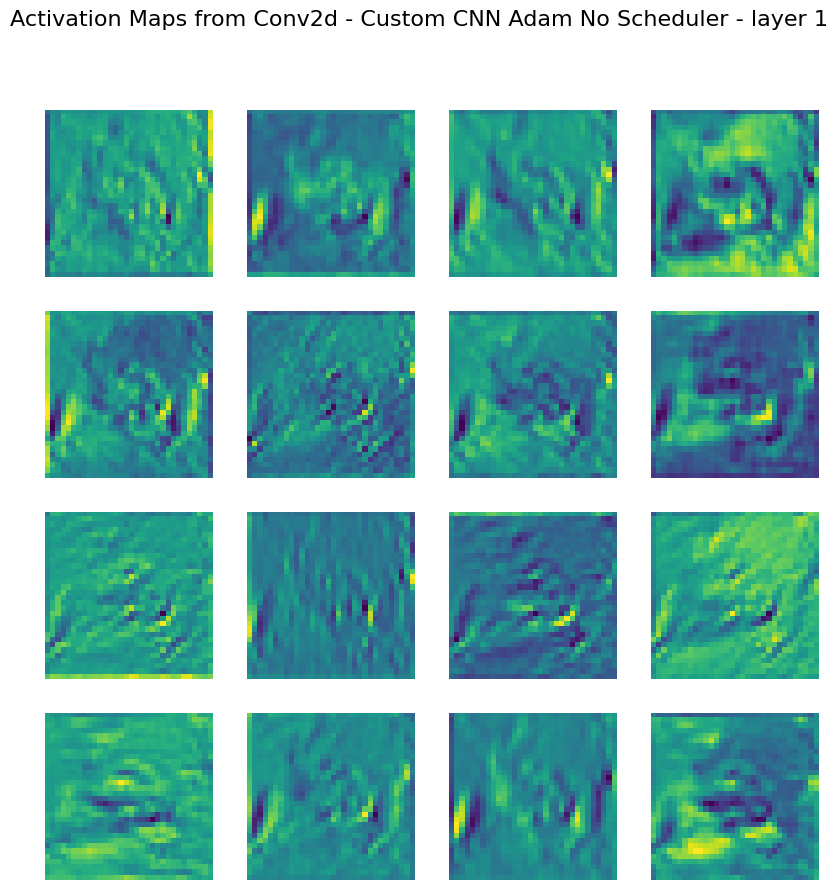

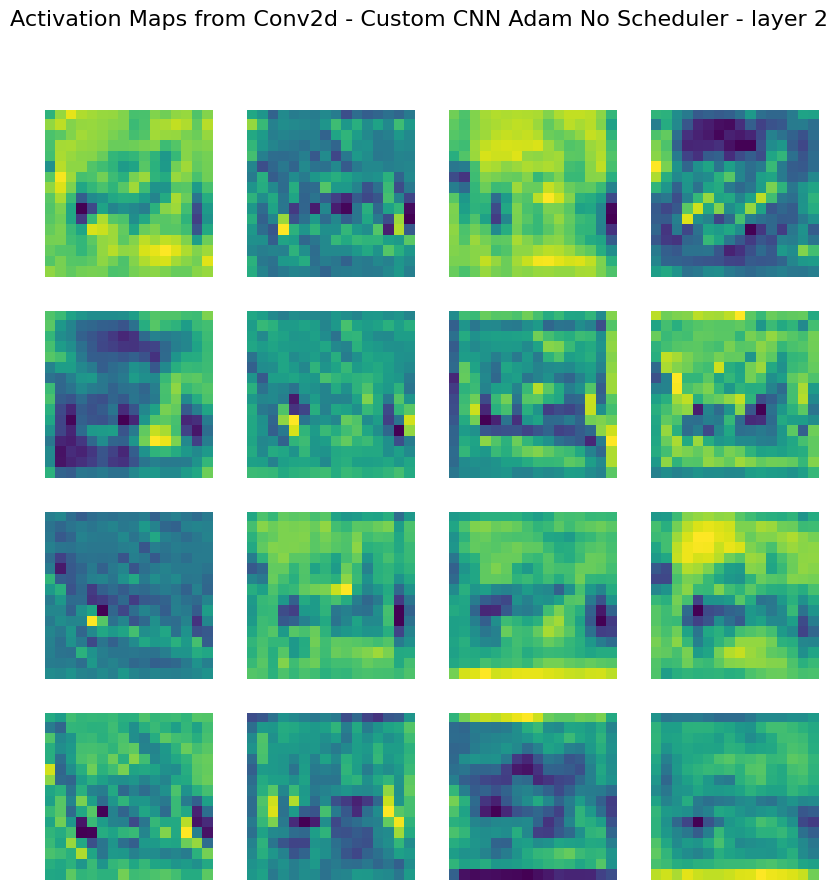

In [44]:
# Plot activation maps from the first two convolutional layer of model_4 comparing to original image
original_img, _ = testset[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_4, model_4.conv1, title='Custom CNN Adam No Scheduler - layer 1')
plot_activation_maps(model_4, model_4.conv2, title='Custom CNN Adam No Scheduler - layer 2')

In [45]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_4.eval()
with torch.no_grad():
    for inputs, labels in testloader:
        outputs = model_4(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.84      0.82      0.83      1000
         car       0.87      0.93      0.90      1000
        bird       0.70      0.76      0.73      1000
         cat       0.66      0.62      0.64      1000
        deer       0.74      0.80      0.77      1000
         dog       0.73      0.70      0.71      1000
        frog       0.88      0.83      0.85      1000
       horse       0.85      0.84      0.84      1000
        ship       0.90      0.89      0.89      1000
       truck       0.88      0.87      0.88      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.80     10000
weighted avg       0.81      0.81      0.80     10000



In [46]:
model_4_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

In [47]:
print(model_4_eval)

{'accuracy': 0.8052, 'precision': 0.8056362204825434, 'recall': 0.8052, 'f1_score': 0.8049395090828874}


In [48]:
# Save the trained model
torch.save(model_4.state_dict(), './model_task1/custom_cnn_4.pth')


### 5. Custom CNN + Adam + StepLR

In [49]:
model_5 = customCNN().to(device)
optimizer_5 = optim.Adam(model_5.parameters(), lr=0.001)
scheduler_5 = lr_scheduler.StepLR(optimizer_5, step_size=7, gamma=0.1)

# Train and evaluate the model using the defined function
model_5, history_5 = train_model(model_5, data_loaders, nn.CrossEntropyLoss(), optimizer_5, scheduler_5, num_epochs=EPOCHS)

Epoch 1/20
----------
train Loss: 1.4917 Acc: 0.4588
val Loss: 1.1774 Acc: 0.5692
Epoch completed in 0m 11s

Epoch 2/20
----------
train Loss: 1.0865 Acc: 0.6152
val Loss: 0.9660 Acc: 0.6596
Epoch completed in 0m 11s

Epoch 3/20
----------
train Loss: 0.9138 Acc: 0.6813
val Loss: 0.8375 Acc: 0.7036
Epoch completed in 0m 11s

Epoch 4/20
----------
train Loss: 0.8045 Acc: 0.7220
val Loss: 0.7466 Acc: 0.7324
Epoch completed in 0m 11s

Epoch 5/20
----------
train Loss: 0.7225 Acc: 0.7483
val Loss: 0.6935 Acc: 0.7554
Epoch completed in 0m 11s

Epoch 6/20
----------
train Loss: 0.6640 Acc: 0.7676
val Loss: 0.6845 Acc: 0.7618
Epoch completed in 0m 12s

Epoch 7/20
----------
train Loss: 0.6116 Acc: 0.7863
val Loss: 0.6797 Acc: 0.7610
Epoch completed in 0m 12s

Epoch 8/20
----------
train Loss: 0.4976 Acc: 0.8273
val Loss: 0.6151 Acc: 0.7864
Epoch completed in 0m 12s

Epoch 9/20
----------
train Loss: 0.4711 Acc: 0.8366
val Loss: 0.6098 Acc: 0.7908
Epoch completed in 0m 12s

Epoch 10/20
-------

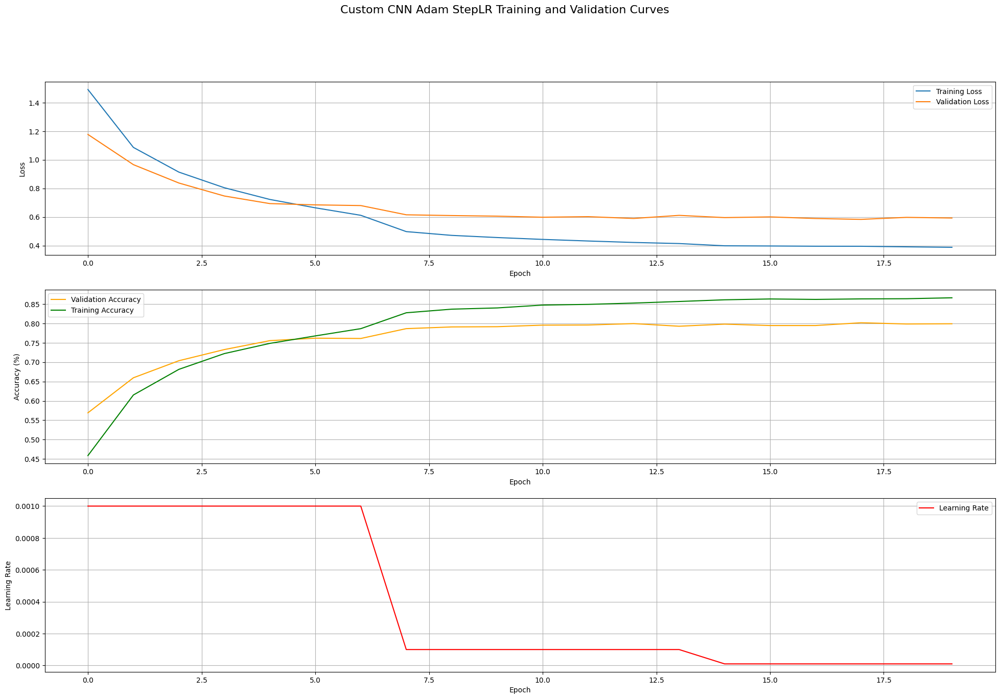

In [50]:
# Visualize training results for model_5
plot_curves(history_5, title='Custom CNN Adam StepLR Training and Validation Curves')

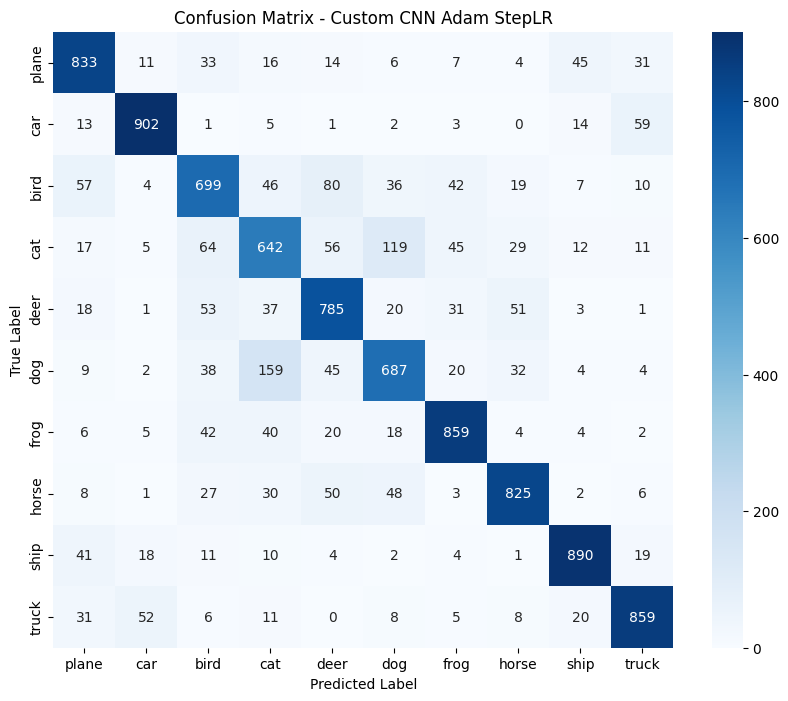

In [51]:
# Plot confusion matrix for model_5
plot_confusion_matrix(model_5, title='Custom CNN Adam StepLR')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32803053..1.555192].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.29627693..1.243108].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22483134..1.4660475].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03713584..1.4666144].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24070817..1.5632443].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49473685..1.4907719].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.447

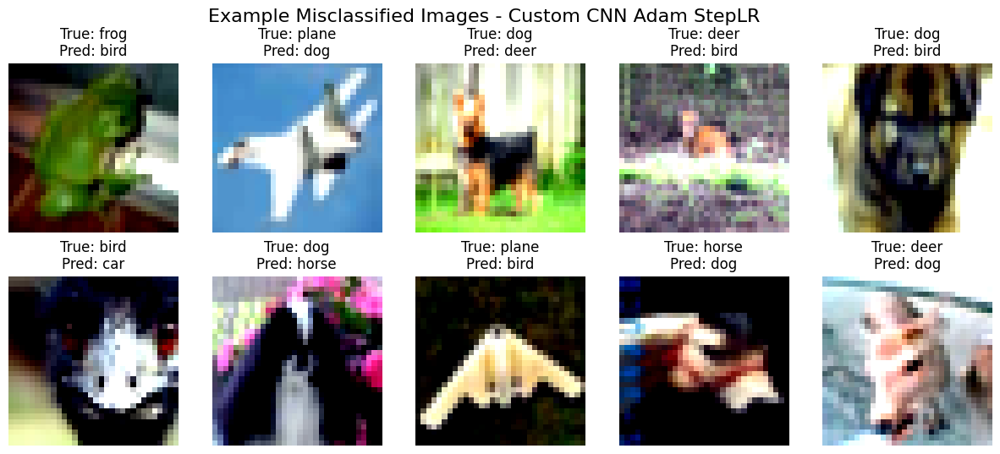

In [52]:
 # Plot misclassified images for model_5
plot_misclassified_images(model_5, title='Custom CNN Adam StepLR')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


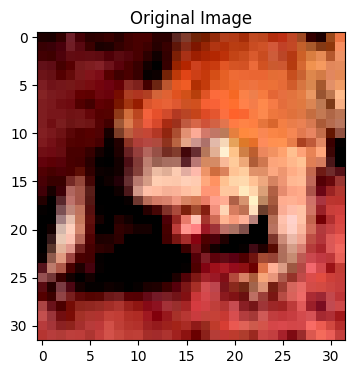

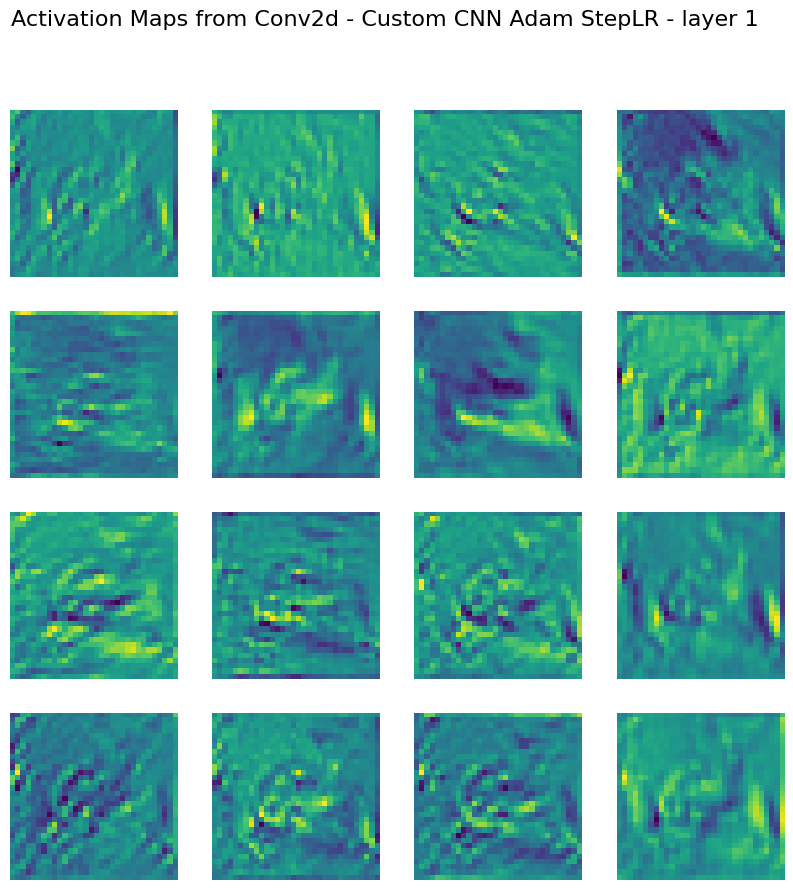

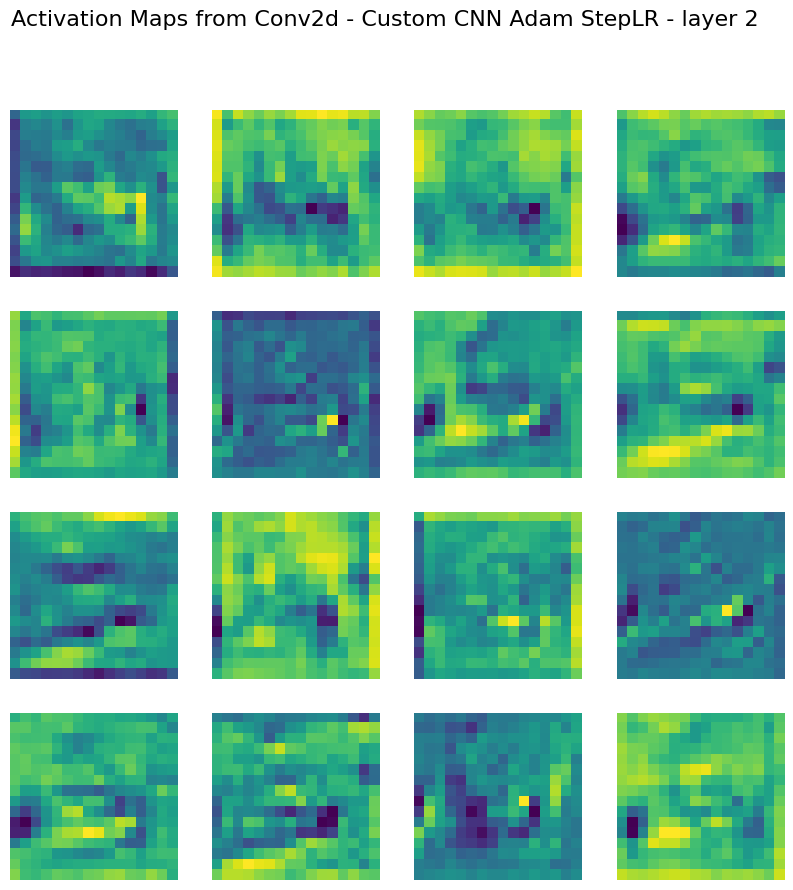

In [53]:
# Plot activation maps from the first two convolutional layer of model_5 comparing to original image
original_img, _ = testset[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_5, model_5.conv1, title='Custom CNN Adam StepLR - layer 1')
plot_activation_maps(model_5, model_5.conv2, title='Custom CNN Adam StepLR - layer 2')

In [54]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_5.eval()
with torch.no_grad():
    for inputs, labels in testloader:
        outputs = model_5(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.82      0.84      0.83      1000
         car       0.90      0.91      0.90      1000
        bird       0.72      0.70      0.71      1000
         cat       0.64      0.63      0.63      1000
        deer       0.75      0.79      0.77      1000
         dog       0.72      0.69      0.71      1000
        frog       0.84      0.86      0.85      1000
       horse       0.85      0.82      0.83      1000
        ship       0.89      0.90      0.89      1000
       truck       0.87      0.85      0.86      1000

    accuracy                           0.80     10000
   macro avg       0.80      0.80      0.80     10000
weighted avg       0.80      0.80      0.80     10000



In [55]:
model_5_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

In [56]:
print(model_5_eval)

{'accuracy': 0.7982, 'precision': 0.797728659025798, 'recall': 0.7982, 'f1_score': 0.797816300237158}


In [57]:
# Save the trained model
torch.save(model_5.state_dict(), './model_task1/custom_cnn_5.pth')


### 6. Custom CNN + Adam + ReduceLROnPlateau

In [58]:
model_6 = customCNN().to(device)
optimizer_6 = optim.Adam(model_6.parameters(), lr=0.001)
scheduler_6 = lr_scheduler.ReduceLROnPlateau(optimizer_6, 'min', patience=3)

# Train and evaluate the model using the defined function
model_6, history_6 = train_model(model_6, data_loaders, nn.CrossEntropyLoss(), optimizer_6, scheduler_6, num_epochs=EPOCHS)

Epoch 1/20
----------
train Loss: 1.5097 Acc: 0.4495
val Loss: 1.1985 Acc: 0.5664
Epoch completed in 0m 12s

Epoch 2/20
----------
train Loss: 1.0991 Acc: 0.6099
val Loss: 0.9749 Acc: 0.6514
Epoch completed in 0m 12s

Epoch 3/20
----------
train Loss: 0.9165 Acc: 0.6792
val Loss: 0.8534 Acc: 0.6988
Epoch completed in 0m 12s

Epoch 4/20
----------
train Loss: 0.8082 Acc: 0.7163
val Loss: 0.7907 Acc: 0.7178
Epoch completed in 0m 12s

Epoch 5/20
----------
train Loss: 0.7405 Acc: 0.7395
val Loss: 0.7267 Acc: 0.7472
Epoch completed in 0m 12s

Epoch 6/20
----------
train Loss: 0.6828 Acc: 0.7606
val Loss: 0.7030 Acc: 0.7520
Epoch completed in 0m 12s

Epoch 7/20
----------
train Loss: 0.6353 Acc: 0.7782
val Loss: 0.6861 Acc: 0.7622
Epoch completed in 0m 12s

Epoch 8/20
----------
train Loss: 0.5884 Acc: 0.7952
val Loss: 0.6731 Acc: 0.7646
Epoch completed in 0m 12s

Epoch 9/20
----------
train Loss: 0.5519 Acc: 0.8067
val Loss: 0.6499 Acc: 0.7776
Epoch completed in 0m 12s

Epoch 10/20
-------

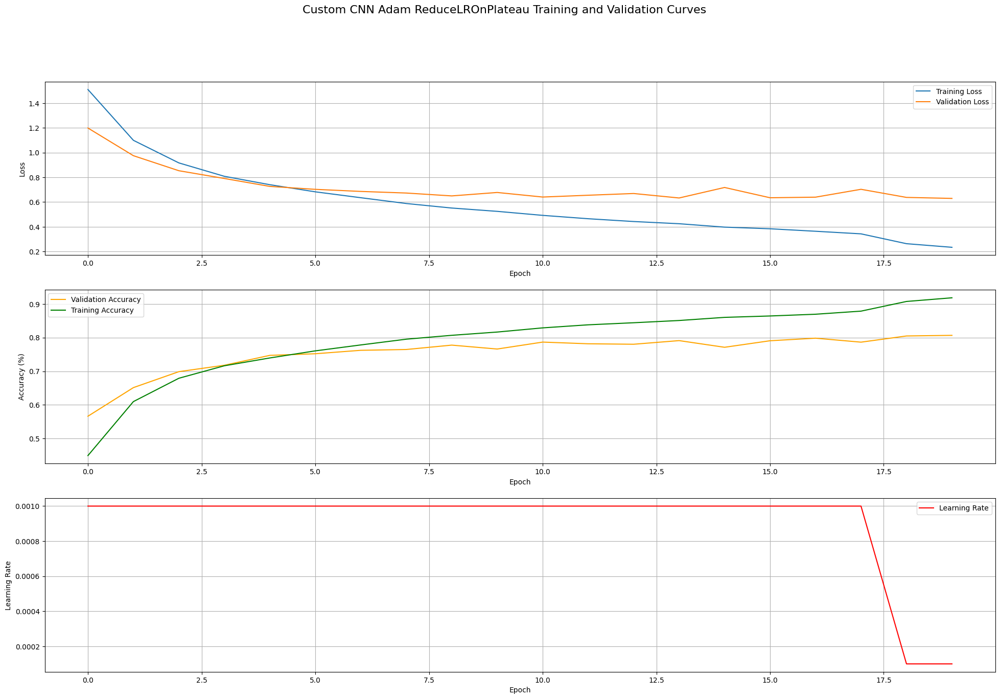

In [59]:
# Visualize training results for model_6
plot_curves(history_6, title='Custom CNN Adam ReduceLROnPlateau Training and Validation Curves')

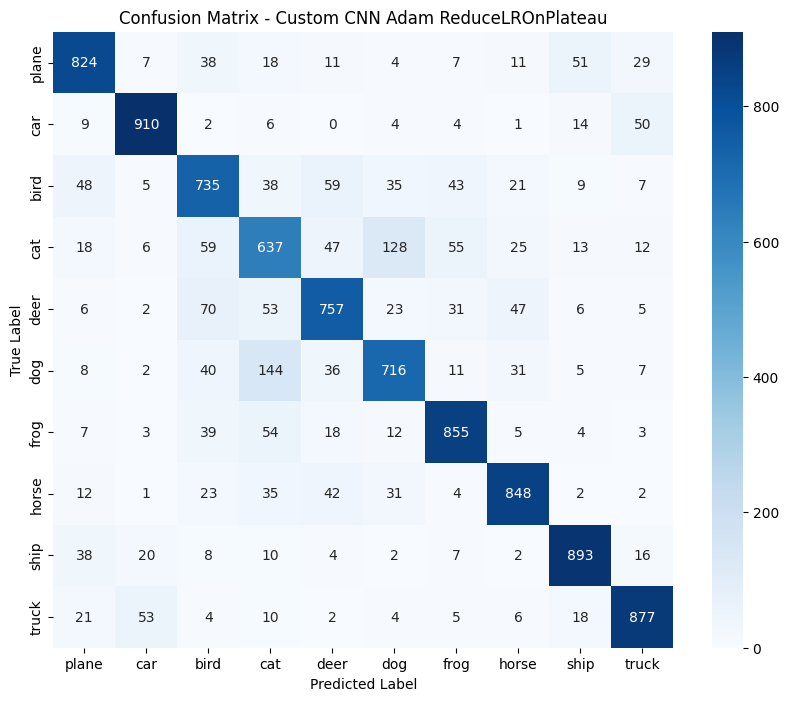

In [60]:
# Plot confusion matrix for model_6
plot_confusion_matrix(model_6, title='Custom CNN Adam ReduceLROnPlateau')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32803053..1.1606592].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22483134..1.4660475].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.40961874..1.4904547].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03713584..1.4666144].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24070817..1.5632443].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49473685..1.4907719].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4

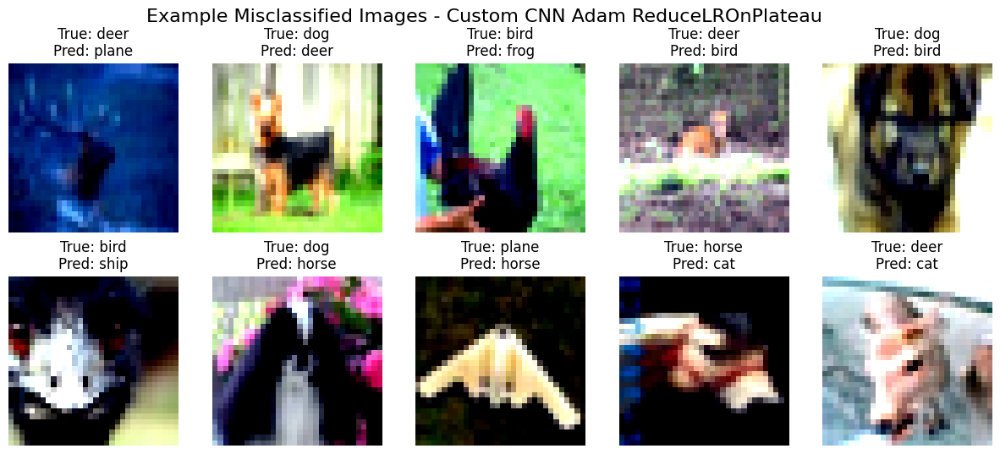

In [61]:
 # Plot misclassified images for model_6
plot_misclassified_images(model_6, title='Custom CNN Adam ReduceLROnPlateau')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


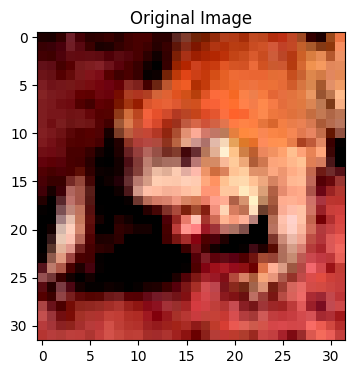

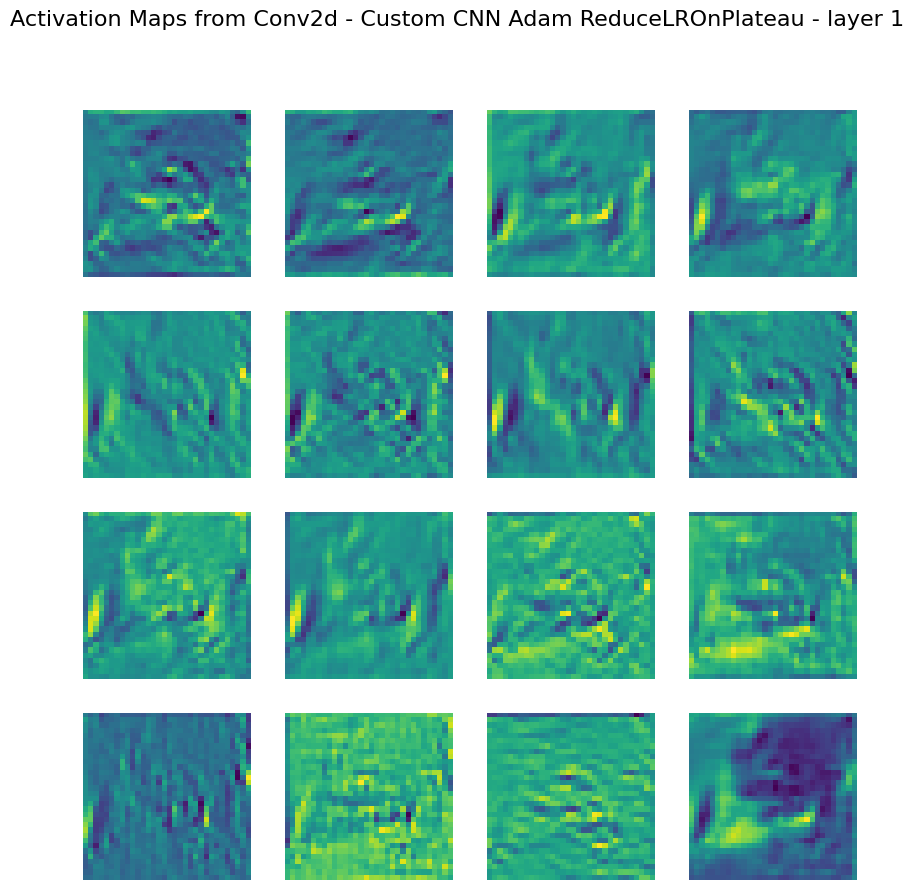

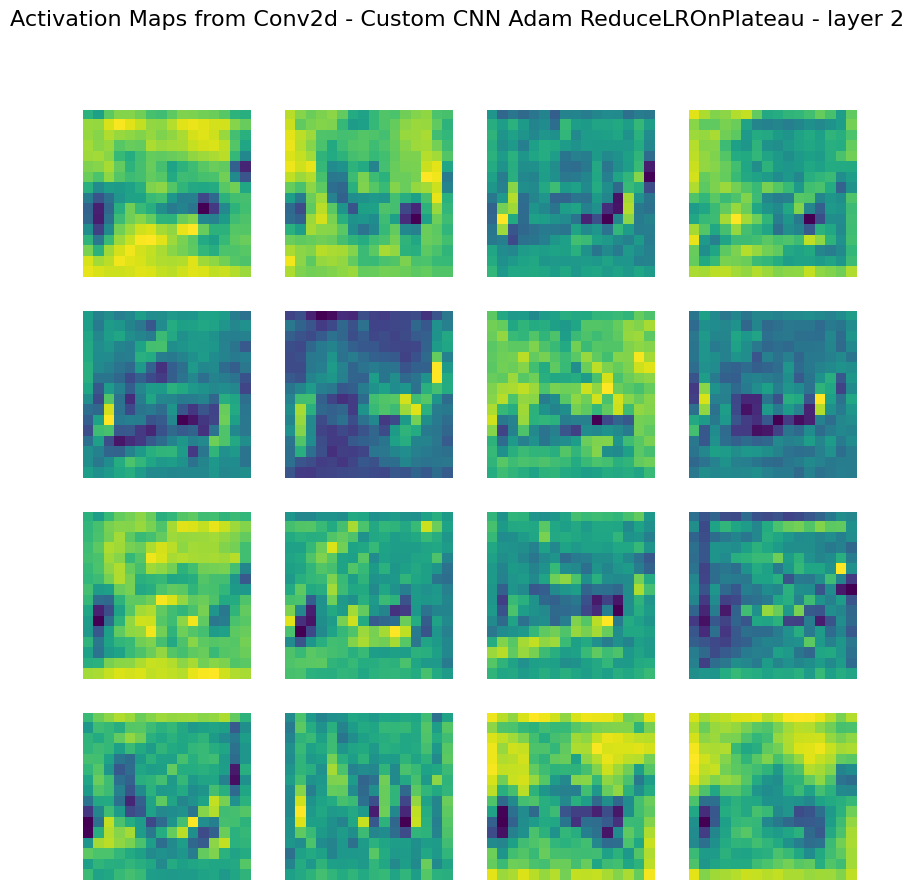

In [62]:
# Plot activation maps from the first two convolutional layer of model_6 comparing to original image
original_img, _ = testset[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_6, model_6.conv1, title='Custom CNN Adam ReduceLROnPlateau - layer 1')
plot_activation_maps(model_6, model_6.conv2, title='Custom CNN Adam ReduceLROnPlateau - layer 2')

In [63]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_6.eval()
with torch.no_grad():
    for inputs, labels in testloader:
        outputs = model_6(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.83      0.83      0.83      1000
         car       0.90      0.91      0.90      1000
        bird       0.73      0.73      0.73      1000
         cat       0.63      0.65      0.64      1000
        deer       0.77      0.77      0.77      1000
         dog       0.74      0.72      0.73      1000
        frog       0.84      0.84      0.84      1000
       horse       0.86      0.84      0.85      1000
        ship       0.89      0.90      0.89      1000
       truck       0.87      0.88      0.88      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



In [64]:
model_6_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

In [65]:
print(model_6_eval)

{'accuracy': 0.8065, 'precision': 0.8065741806118852, 'recall': 0.8065, 'f1_score': 0.8065017143971313}


In [66]:
# Save the trained model
torch.save(model_6.state_dict(), './model_task1/custom_cnn_6.pth')


### Show the layer of resnet model

In [67]:
# Show the layer of resnet model
resnet_model = get_resnet18_model(device)
print(resnet_model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


### 7. ResNet (Transfer Learning) + SGD + No Learning Rate Schedule

In [68]:
model_7 = get_resnet18_model(device)
optimizer_7 = optim.SGD(model_7.fc.parameters(), lr=0.001)
scheduler_7 = None

# Train and evaluate the model using the defined function with ResNet dataloaders (224x224 images)
model_7, history_7 = train_model(model_7, data_loaders_resnet, nn.CrossEntropyLoss(), optimizer_7, scheduler_7, num_epochs=EPOCHS)

Epoch 1/20
----------
train Loss: 2.0275 Acc: 0.3155
val Loss: 1.7511 Acc: 0.4946
Epoch completed in 0m 45s

Epoch 2/20
----------
train Loss: 1.5690 Acc: 0.5729
val Loss: 1.4136 Acc: 0.6298
Epoch completed in 0m 44s

Epoch 3/20
----------
train Loss: 1.3165 Acc: 0.6579
val Loss: 1.2238 Acc: 0.6820
Epoch completed in 0m 44s

Epoch 4/20
----------
train Loss: 1.1644 Acc: 0.6951
val Loss: 1.1037 Acc: 0.7090
Epoch completed in 0m 44s

Epoch 5/20
----------
train Loss: 1.0630 Acc: 0.7153
val Loss: 1.0198 Acc: 0.7168
Epoch completed in 0m 44s

Epoch 6/20
----------
train Loss: 0.9955 Acc: 0.7258
val Loss: 0.9596 Acc: 0.7292
Epoch completed in 0m 44s

Epoch 7/20
----------
train Loss: 0.9443 Acc: 0.7341
val Loss: 0.9171 Acc: 0.7334
Epoch completed in 0m 44s

Epoch 8/20
----------
train Loss: 0.9049 Acc: 0.7393
val Loss: 0.8797 Acc: 0.7400
Epoch completed in 0m 44s

Epoch 9/20
----------
train Loss: 0.8726 Acc: 0.7459
val Loss: 0.8556 Acc: 0.7476
Epoch completed in 0m 45s

Epoch 10/20
-------

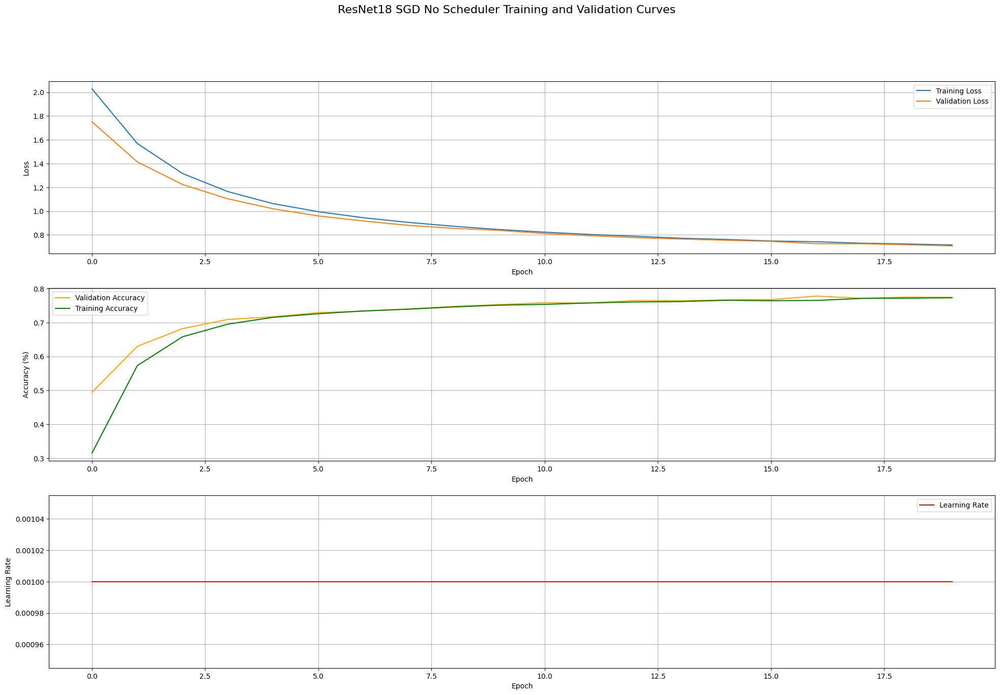

In [69]:
# Visualize training results for model_7
plot_curves(history_7, title='ResNet18 SGD No Scheduler Training and Validation Curves')

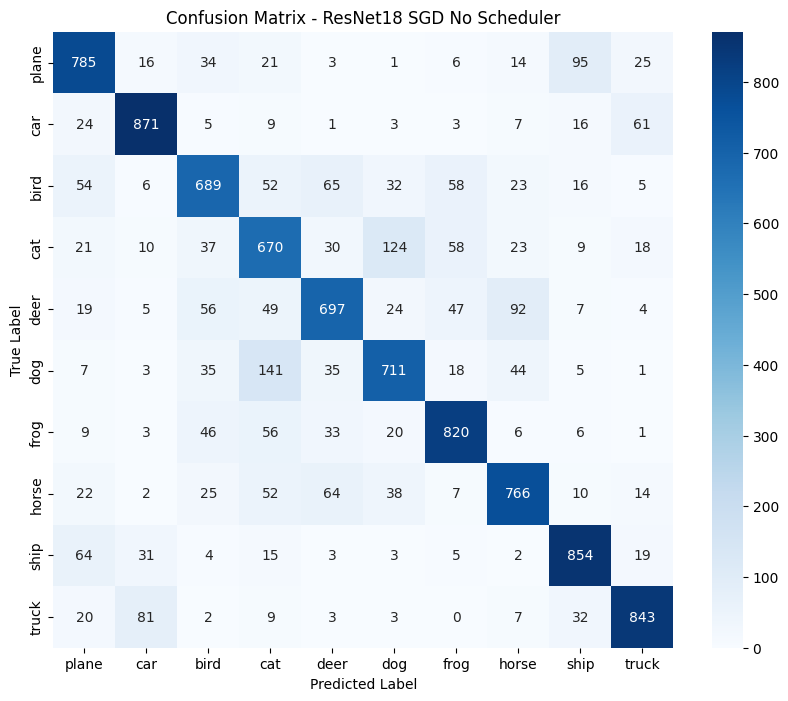

In [70]:
# Plot confusion matrix for model_7
plot_confusion_matrix(model_7, title='ResNet18 SGD No Scheduler', test_loader=testloader_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49473685..1.5471393].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.40961874..1.4904547].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.41767126..1.5068768].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24051619..1.2517108].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.4904547].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.46598625..1.555192].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4

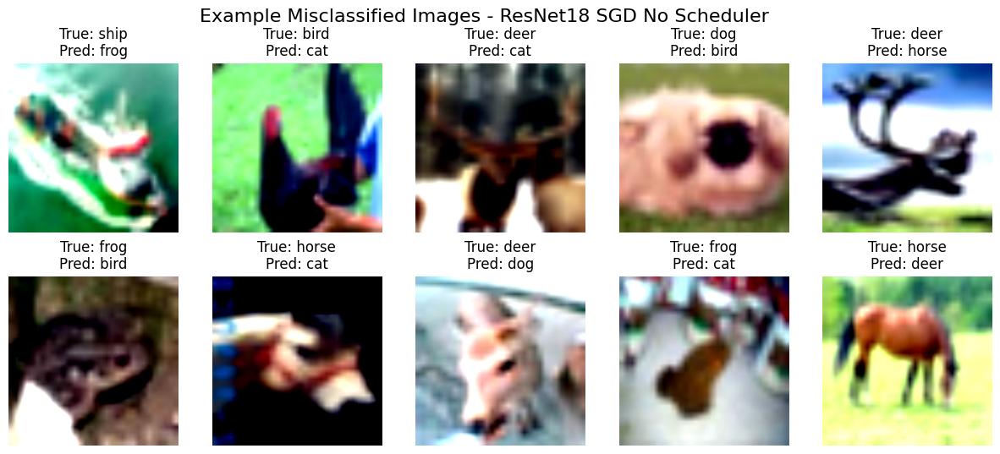

In [71]:
 # Plot misclassified images for model_7
plot_misclassified_images(model_7, title='ResNet18 SGD No Scheduler', test_loader=testloader_resnet, test_dataset=testset_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


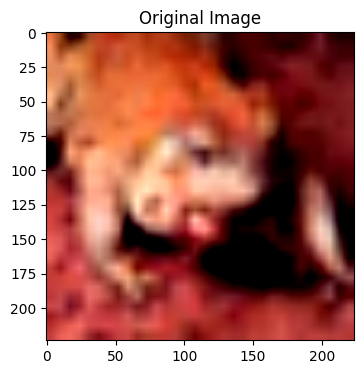

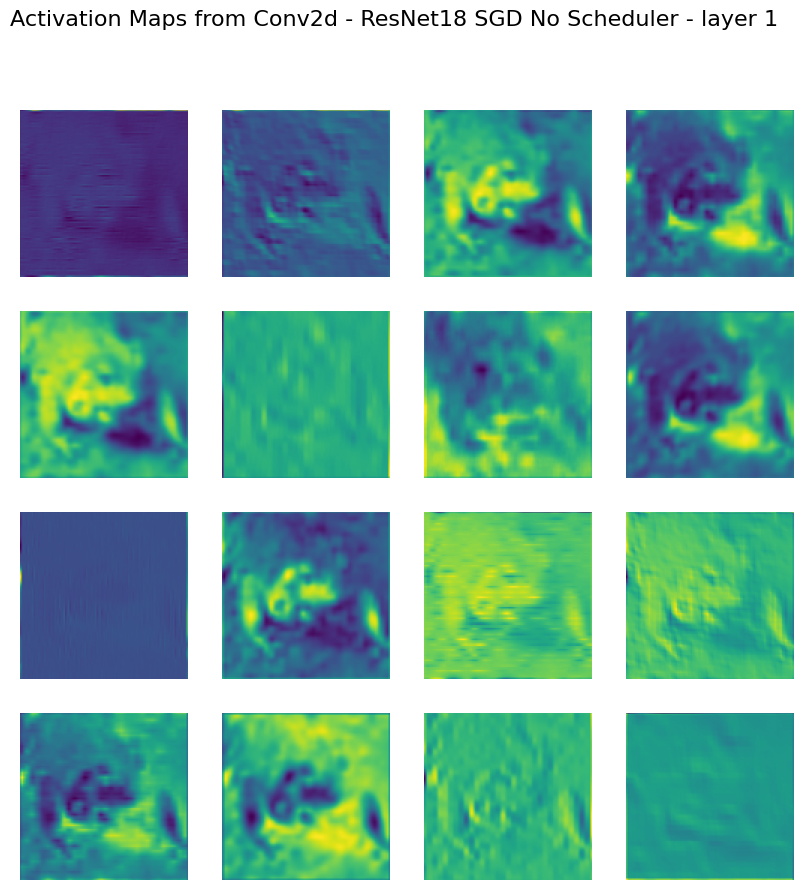

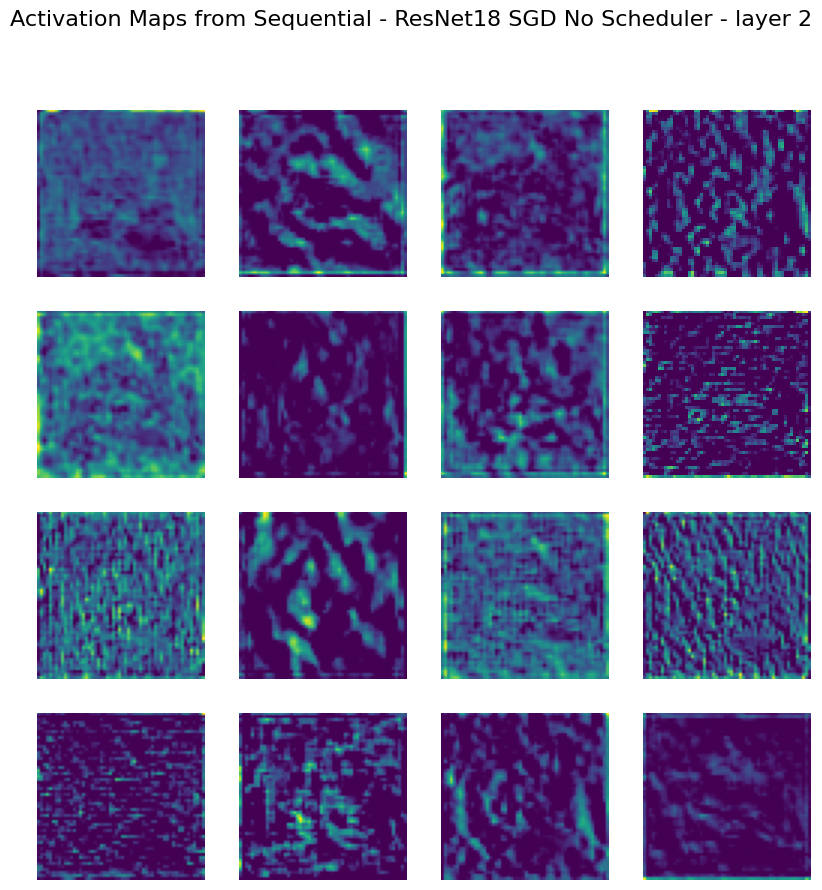

In [72]:
# Plot activation maps from the first two convolutional layer of model_7 comparing to original image
original_img, _ = testset_resnet[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_7, model_7.conv1, title='ResNet18 SGD No Scheduler - layer 1', test_dataset=testset_resnet)
plot_activation_maps(model_7, model_7.layer1, title='ResNet18 SGD No Scheduler - layer 2', test_dataset=testset_resnet)

In [73]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_7.eval()
with torch.no_grad():
    for inputs, labels in testloader_resnet:
        outputs = model_7(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.75      0.77      0.76      1000
         car       0.84      0.86      0.85      1000
        bird       0.75      0.68      0.71      1000
         cat       0.62      0.66      0.64      1000
        deer       0.75      0.70      0.72      1000
         dog       0.73      0.71      0.72      1000
        frog       0.79      0.82      0.80      1000
       horse       0.76      0.77      0.76      1000
        ship       0.80      0.85      0.83      1000
       truck       0.85      0.82      0.83      1000

    accuracy                           0.76     10000
   macro avg       0.76      0.76      0.76     10000
weighted avg       0.76      0.76      0.76     10000



In [74]:
model_7_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

In [75]:
print(model_7_eval)

{'accuracy': 0.7635, 'precision': 0.763792133883186, 'recall': 0.7635, 'f1_score': 0.7631896490031225}


In [76]:
# Save the trained model
torch.save(model_7.state_dict(), './model_task1/custom_cnn_7.pth')


### 8. ResNet (Transfer Learning) + SGD + StepLR

In [77]:
model_8 = get_resnet18_model(device)
optimizer_8 = optim.SGD(model_8.fc.parameters(), lr=0.001)
scheduler_8 = lr_scheduler.StepLR(optimizer_8, step_size=7, gamma=0.1)

# Train and evaluate the model using the defined function with ResNet dataloaders (224x224 images)
model_8, history_8 = train_model(model_8, data_loaders_resnet, nn.CrossEntropyLoss(), optimizer_8, scheduler_8, num_epochs=EPOCHS)

Epoch 1/20
----------


c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


train Loss: 2.0129 Acc: 0.3144
val Loss: 1.7391 Acc: 0.4930
Epoch completed in 0m 45s

Epoch 2/20
----------
train Loss: 1.5581 Acc: 0.5743
val Loss: 1.4165 Acc: 0.6274
Epoch completed in 0m 44s

Epoch 3/20
----------
train Loss: 1.3102 Acc: 0.6579
val Loss: 1.2226 Acc: 0.6790
Epoch completed in 0m 44s

Epoch 4/20
----------
train Loss: 1.1631 Acc: 0.6926
val Loss: 1.1071 Acc: 0.7068
Epoch completed in 0m 44s

Epoch 5/20
----------
train Loss: 1.0646 Acc: 0.7145
val Loss: 1.0175 Acc: 0.7246
Epoch completed in 0m 45s

Epoch 6/20
----------
train Loss: 0.9975 Acc: 0.7236
val Loss: 0.9603 Acc: 0.7312
Epoch completed in 0m 45s

Epoch 7/20
----------
train Loss: 0.9470 Acc: 0.7328
val Loss: 0.9152 Acc: 0.7402
Epoch completed in 0m 44s

Epoch 8/20
----------
train Loss: 0.9222 Acc: 0.7364
val Loss: 0.9223 Acc: 0.7308
Epoch completed in 0m 44s

Epoch 9/20
----------
train Loss: 0.9184 Acc: 0.7376
val Loss: 0.9132 Acc: 0.7344
Epoch completed in 0m 44s

Epoch 10/20
----------
train Loss: 0.9105

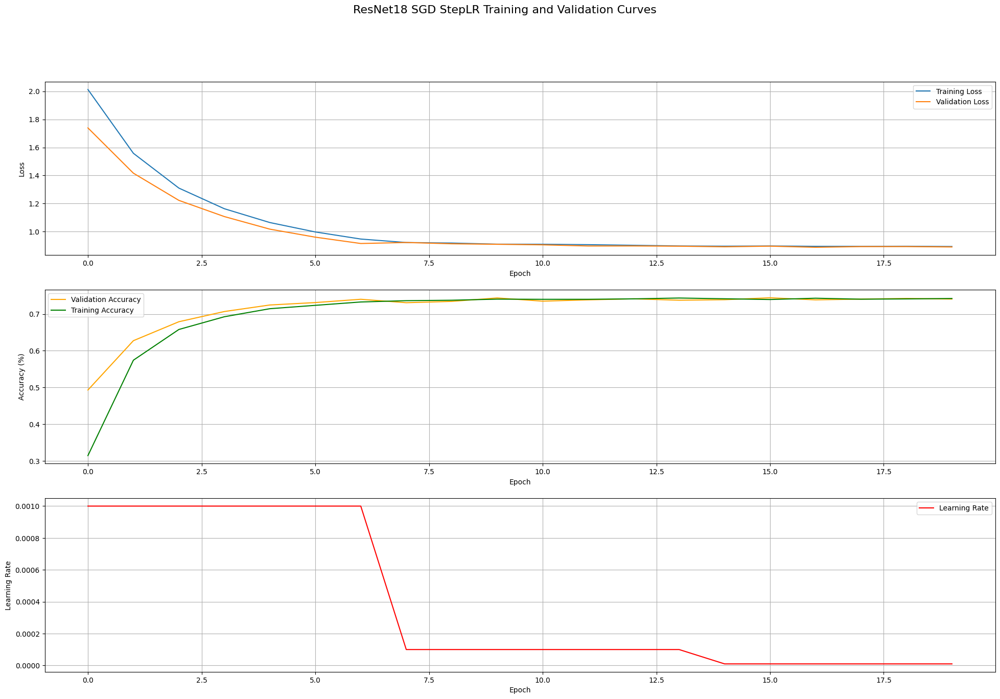

In [78]:
# Visualize training results for model_8
plot_curves(history_8, title='ResNet18 SGD StepLR Training and Validation Curves')

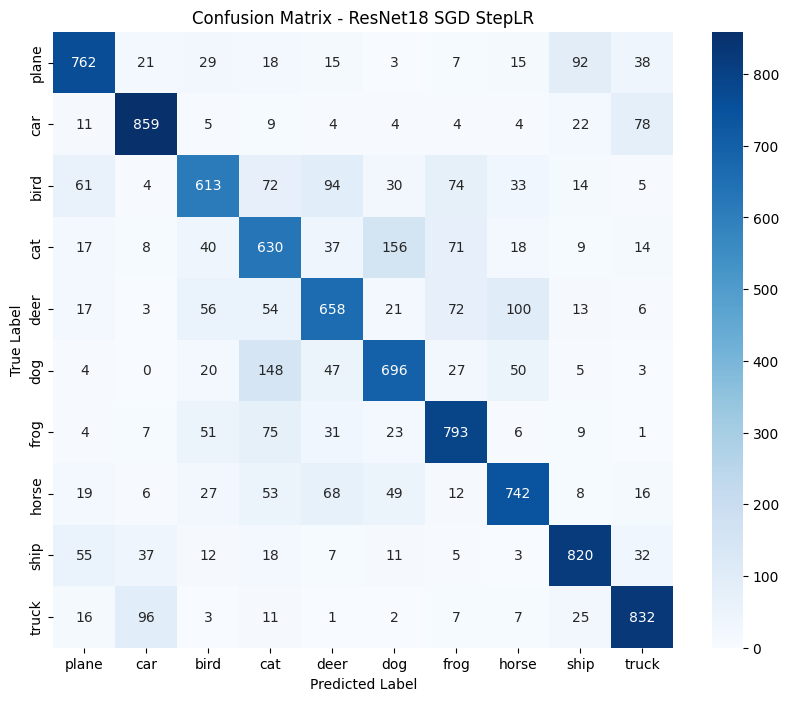

In [79]:
# Plot confusion matrix for model_8
plot_confusion_matrix(model_8, title='ResNet18 SGD StepLR', test_loader=testloader_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22441113..1.4005105].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48679847..1.557913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32803053..1.555192].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49473685..1.5471393].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32803053..1.1606592].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22

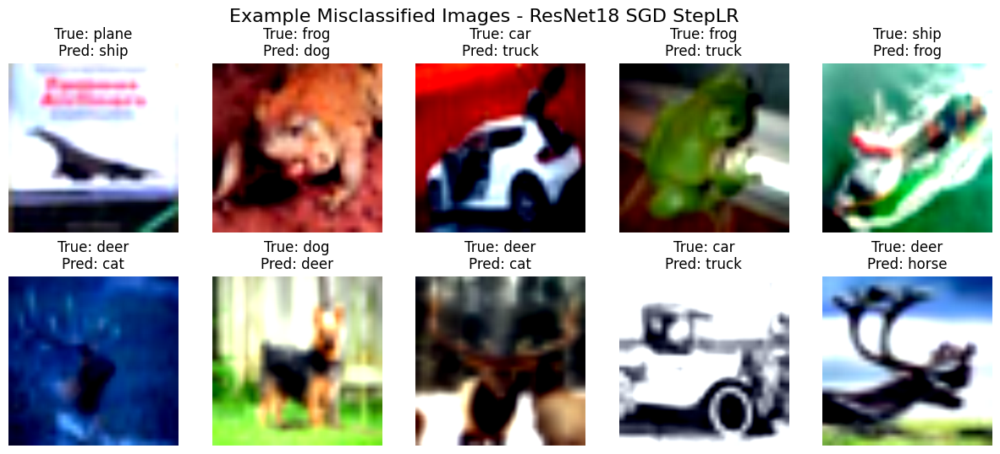

In [80]:
 # Plot misclassified images for model_8
plot_misclassified_images(model_8, title='ResNet18 SGD StepLR', test_loader=testloader_resnet, test_dataset=testset_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


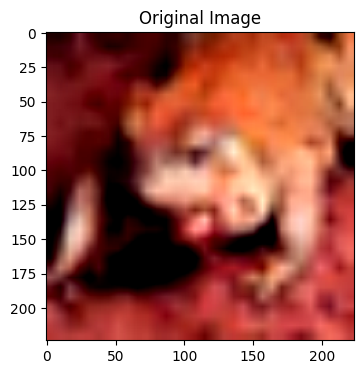

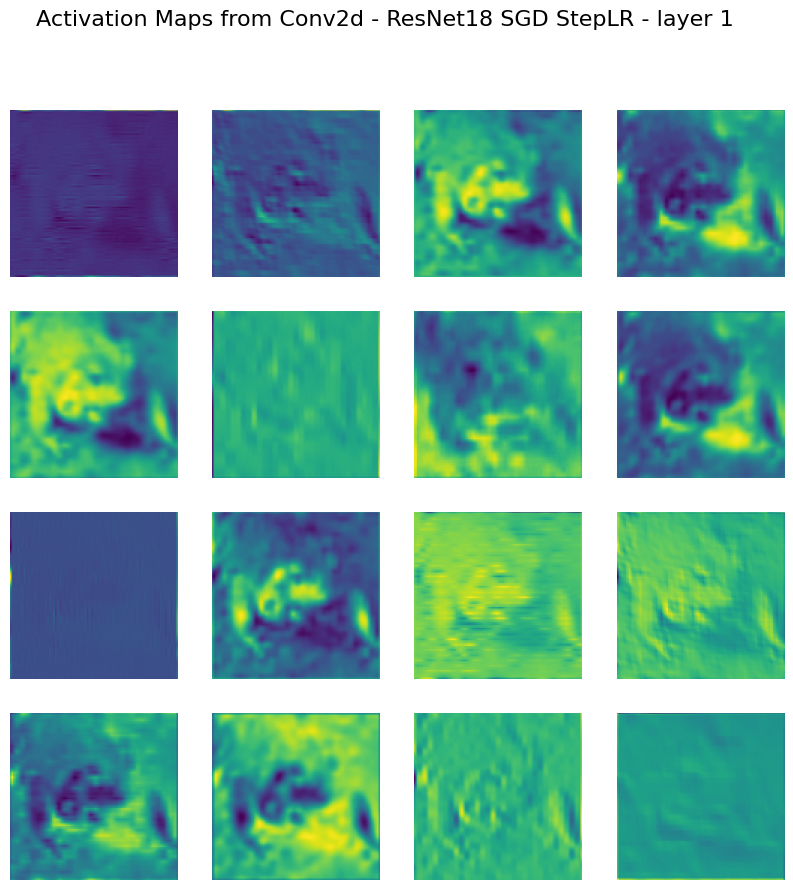

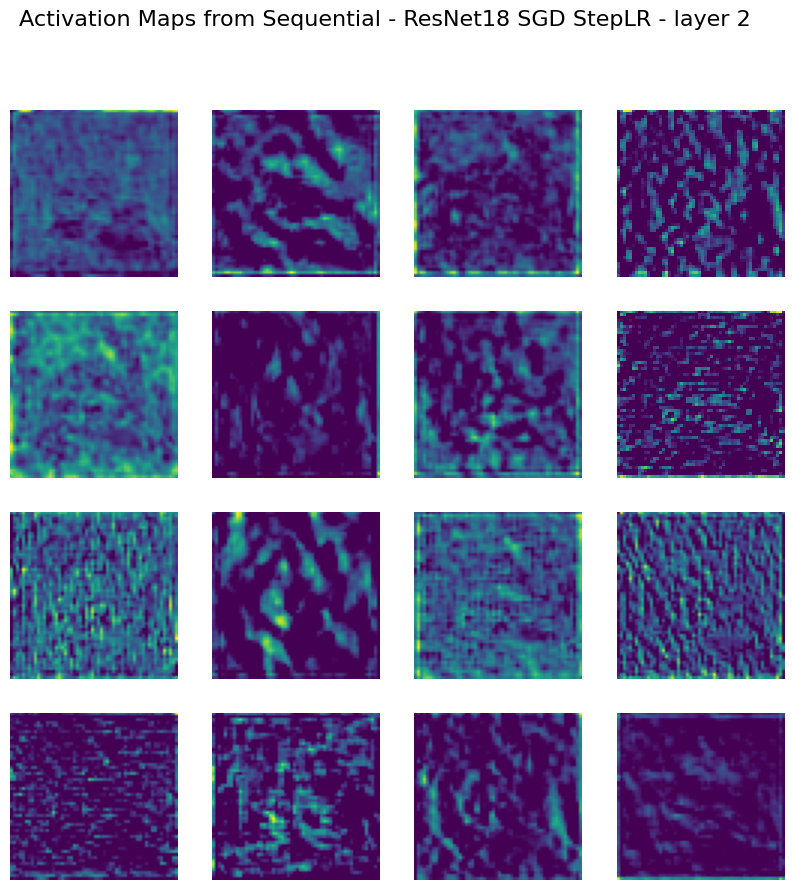

In [81]:
# Plot activation maps from the first two convolutional layer of model_8 comparing to original image
original_img, _ = testset_resnet[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_8, model_8.conv1, title='ResNet18 SGD StepLR - layer 1', test_dataset=testset_resnet)
plot_activation_maps(model_8, model_8.layer1, title='ResNet18 SGD StepLR - layer 2', test_dataset=testset_resnet)

In [82]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_8.eval()
with torch.no_grad():
    for inputs, labels in testloader_resnet:
        outputs = model_8(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.79      0.75      0.77      1000
         car       0.83      0.85      0.84      1000
        bird       0.72      0.62      0.67      1000
         cat       0.58      0.62      0.60      1000
        deer       0.70      0.69      0.69      1000
         dog       0.70      0.70      0.70      1000
        frog       0.76      0.81      0.78      1000
       horse       0.76      0.75      0.75      1000
        ship       0.80      0.82      0.81      1000
       truck       0.81      0.84      0.82      1000

    accuracy                           0.74     10000
   macro avg       0.74      0.74      0.74     10000
weighted avg       0.74      0.74      0.74     10000



In [83]:
model_8_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

In [84]:
print(model_8_eval)

{'accuracy': 0.7448, 'precision': 0.7448873299498717, 'recall': 0.7448, 'f1_score': 0.7442648706310258}


In [85]:
# Save the trained model
torch.save(model_8.state_dict(), './model_task1/custom_cnn_8.pth')


### 9. ResNet (Transfer Learning) + SGD + ReduceLROnPlateau

In [86]:
model_9 = get_resnet18_model(device)
optimizer_9 = optim.SGD(model_9.fc.parameters(), lr=0.001)
scheduler_9 = lr_scheduler.ReduceLROnPlateau(optimizer_9, 'min', patience=3)

# Train and evaluate the model using the defined function with ResNet dataloaders (224x224 images)
model_9, history_9 = train_model(model_9, data_loaders_resnet, nn.CrossEntropyLoss(), optimizer_9, scheduler_9, num_epochs=EPOCHS)

Epoch 1/20
----------


c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


train Loss: 2.0429 Acc: 0.3010
val Loss: 1.7508 Acc: 0.4908
Epoch completed in 0m 45s

Epoch 2/20
----------
train Loss: 1.5780 Acc: 0.5637
val Loss: 1.4204 Acc: 0.6184
Epoch completed in 0m 45s

Epoch 3/20
----------
train Loss: 1.3237 Acc: 0.6499
val Loss: 1.2284 Acc: 0.6790
Epoch completed in 0m 45s

Epoch 4/20
----------
train Loss: 1.1719 Acc: 0.6892
val Loss: 1.1112 Acc: 0.7046
Epoch completed in 0m 45s

Epoch 5/20
----------
train Loss: 1.0714 Acc: 0.7095
val Loss: 1.0209 Acc: 0.7288
Epoch completed in 0m 45s

Epoch 6/20
----------
train Loss: 1.0018 Acc: 0.7202
val Loss: 0.9668 Acc: 0.7356
Epoch completed in 0m 45s

Epoch 7/20
----------
train Loss: 0.9488 Acc: 0.7308
val Loss: 0.9209 Acc: 0.7386
Epoch completed in 0m 45s

Epoch 8/20
----------
train Loss: 0.9052 Acc: 0.7393
val Loss: 0.8837 Acc: 0.7482
Epoch completed in 0m 45s

Epoch 9/20
----------
train Loss: 0.8738 Acc: 0.7441
val Loss: 0.8557 Acc: 0.7534
Epoch completed in 0m 45s

Epoch 10/20
----------
train Loss: 0.8480

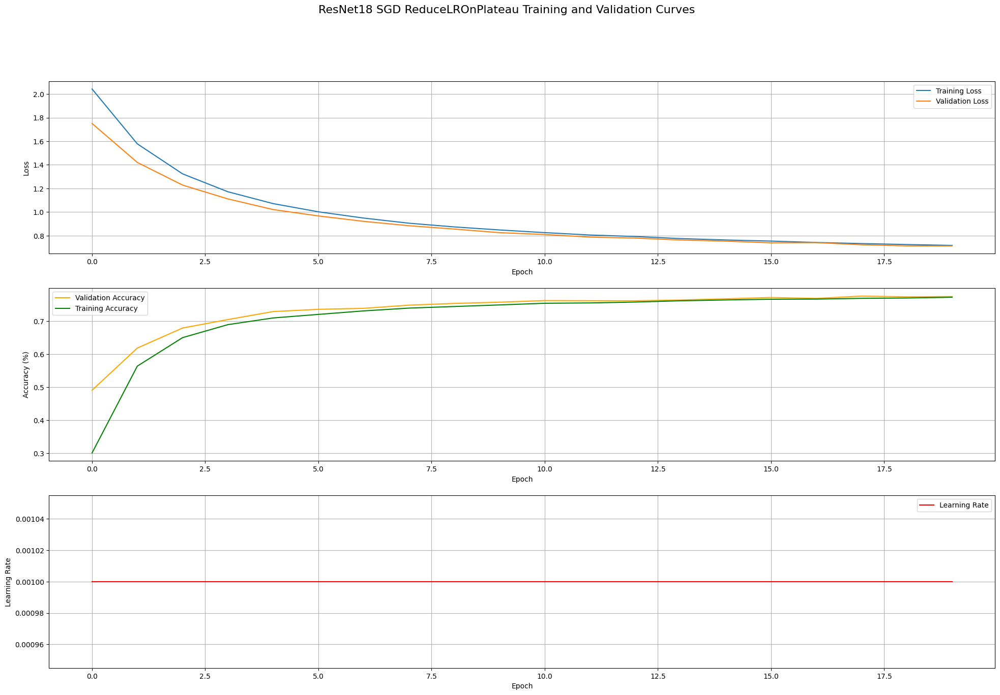

In [87]:
# Visualize training results for model_9
plot_curves(history_9, title='ResNet18 SGD ReduceLROnPlateau Training and Validation Curves')

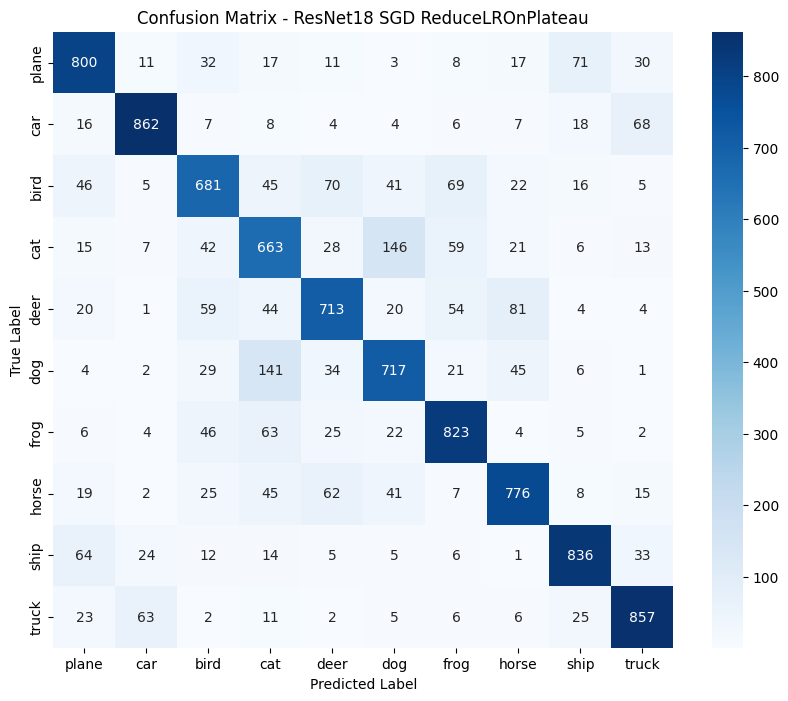

In [88]:
# Plot confusion matrix for model_9
plot_confusion_matrix(model_9, title='ResNet18 SGD ReduceLROnPlateau', test_loader=testloader_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49473685..1.4979501].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48679847..1.557913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49473685..1.5632443].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49473685..1.5471393].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.25662118..1.4229965].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2

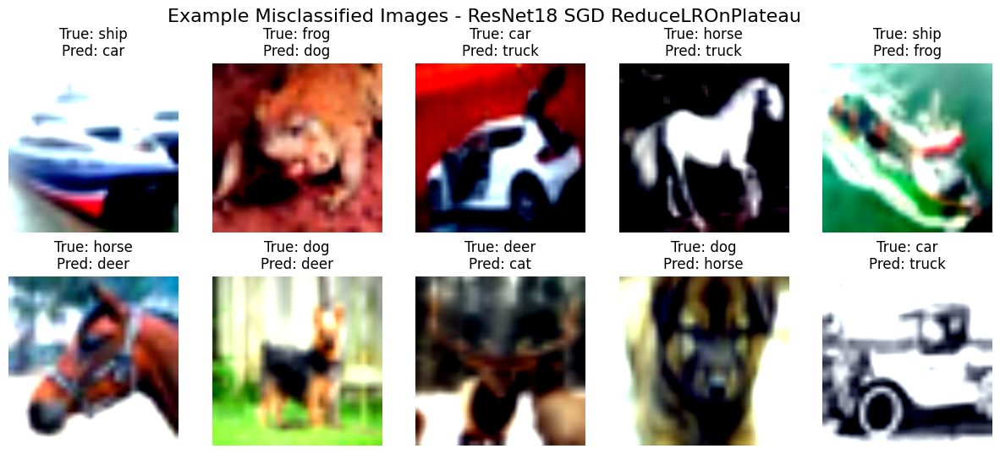

In [89]:
 # Plot misclassified images for model_9
plot_misclassified_images(model_9, title='ResNet18 SGD ReduceLROnPlateau', test_loader=testloader_resnet, test_dataset=testset_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


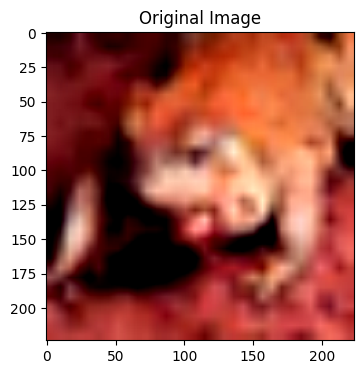

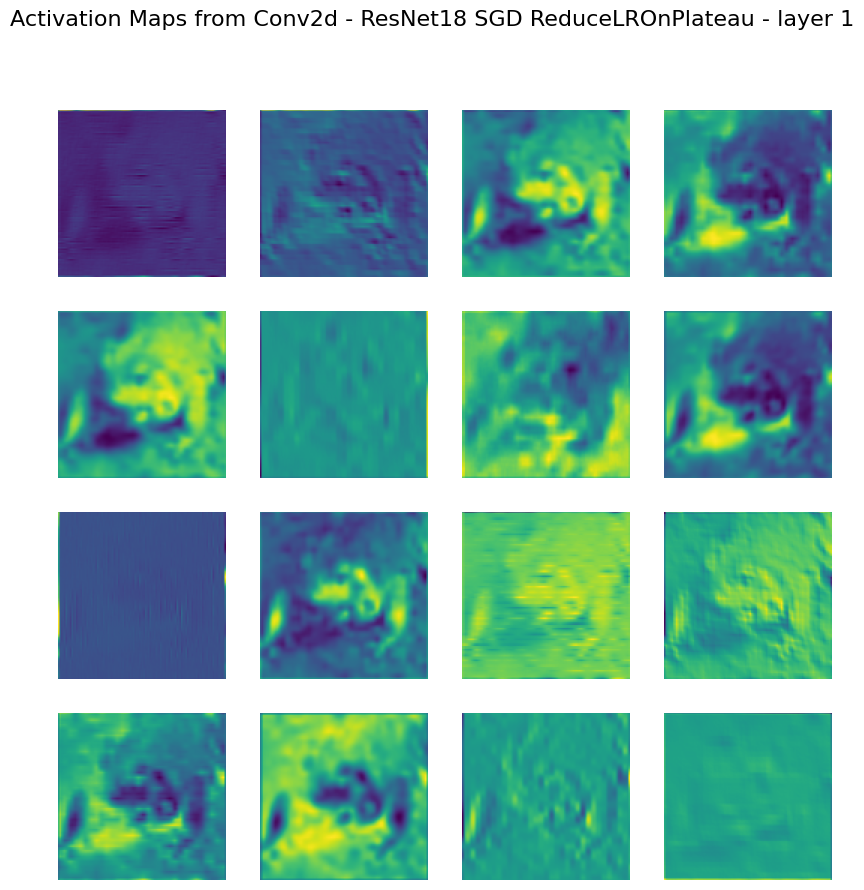

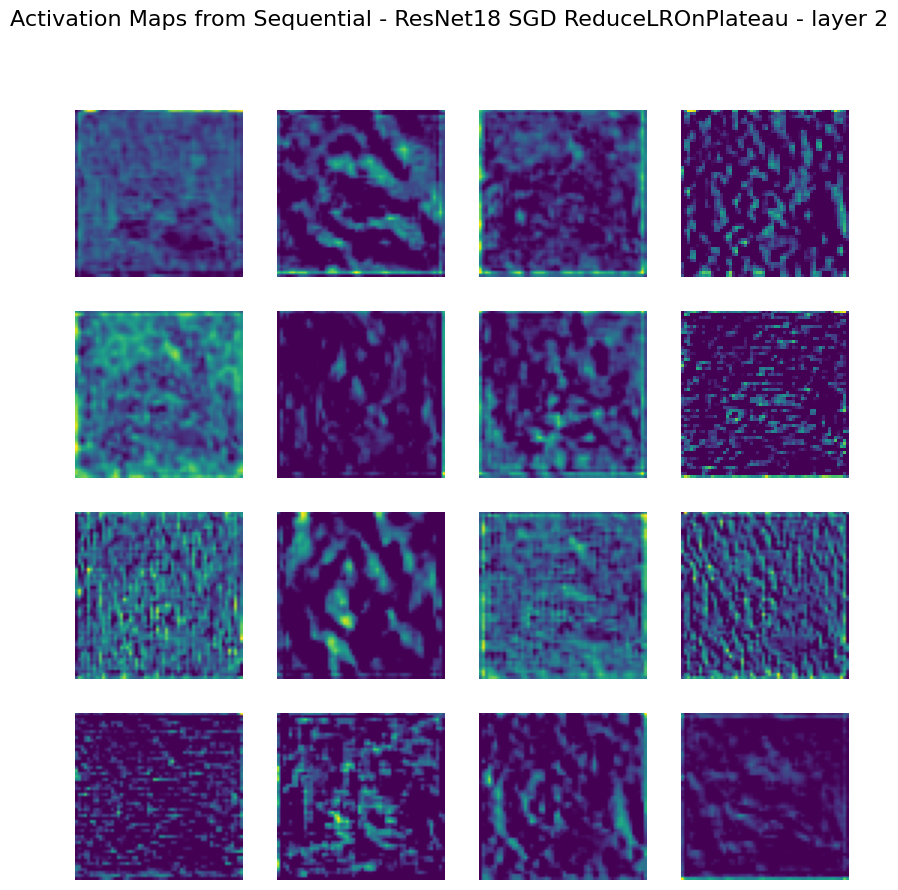

In [90]:
# Plot activation maps from the first two convolutional layer of model_9 comparing to original image
original_img, _ = testset_resnet[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_9, model_9.conv1, title='ResNet18 SGD ReduceLROnPlateau - layer 1', test_dataset=testset_resnet)
plot_activation_maps(model_9, model_9.layer1, title='ResNet18 SGD ReduceLROnPlateau - layer 2', test_dataset=testset_resnet)

In [91]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_9.eval()
with torch.no_grad():
    for inputs, labels in testloader_resnet:
        outputs = model_9(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.78      0.79      0.79      1000
         car       0.87      0.86      0.86      1000
        bird       0.73      0.68      0.71      1000
         cat       0.64      0.64      0.64      1000
        deer       0.75      0.71      0.73      1000
         dog       0.71      0.72      0.72      1000
        frog       0.77      0.82      0.79      1000
       horse       0.78      0.78      0.78      1000
        ship       0.82      0.84      0.83      1000
       truck       0.83      0.84      0.84      1000

    accuracy                           0.77     10000
   macro avg       0.77      0.77      0.77     10000
weighted avg       0.77      0.77      0.77     10000



In [92]:
model_9_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

In [93]:
print(model_9_eval)

{'accuracy': 0.7688, 'precision': 0.7684370390039238, 'recall': 0.7688, 'f1_score': 0.7683669375254173}


In [94]:
# Save the trained model
torch.save(model_9.state_dict(), './model_task1/custom_cnn_9.pth')


### 10. ResNet (Transfer Learning) + Adam + No Learning Rate Schedule

In [95]:
model_10 = get_resnet18_model(device)
optimizer_10 = optim.Adam(model_10.fc.parameters(), lr=0.001)
scheduler_10 = None

# Train and evaluate the model using the defined function with ResNet dataloaders (224x224 images)
model_10, history_10 = train_model(model_10, data_loaders_resnet, nn.CrossEntropyLoss(), optimizer_10, scheduler_10, num_epochs=EPOCHS)

Epoch 1/20
----------


c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


train Loss: 0.9295 Acc: 0.7089
val Loss: 0.6763 Acc: 0.7710
Epoch completed in 0m 45s

Epoch 2/20
----------
train Loss: 0.6313 Acc: 0.7873
val Loss: 0.6213 Acc: 0.7900
Epoch completed in 0m 45s

Epoch 3/20
----------
train Loss: 0.5954 Acc: 0.7952
val Loss: 0.6068 Acc: 0.7854
Epoch completed in 0m 45s

Epoch 4/20
----------
train Loss: 0.5789 Acc: 0.8012
val Loss: 0.5922 Acc: 0.7944
Epoch completed in 0m 45s

Epoch 5/20
----------
train Loss: 0.5629 Acc: 0.8065
val Loss: 0.5688 Acc: 0.8004
Epoch completed in 0m 45s

Epoch 6/20
----------
train Loss: 0.5558 Acc: 0.8064
val Loss: 0.5735 Acc: 0.7986
Epoch completed in 0m 45s

Epoch 7/20
----------
train Loss: 0.5525 Acc: 0.8071
val Loss: 0.5666 Acc: 0.8022
Epoch completed in 0m 45s

Epoch 8/20
----------
train Loss: 0.5433 Acc: 0.8100
val Loss: 0.5800 Acc: 0.7970
Epoch completed in 0m 45s

Epoch 9/20
----------
train Loss: 0.5415 Acc: 0.8125
val Loss: 0.5609 Acc: 0.8080
Epoch completed in 0m 45s

Epoch 10/20
----------
train Loss: 0.5376

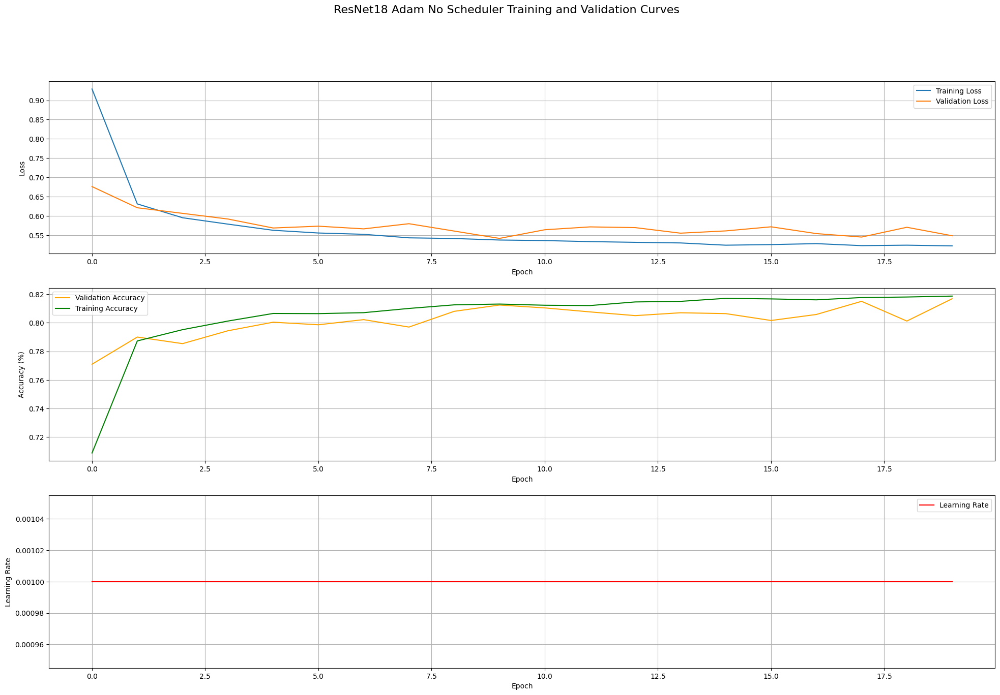

In [96]:
# Visualize training results for model_10
plot_curves(history_10, title='ResNet18 Adam No Scheduler Training and Validation Curves')

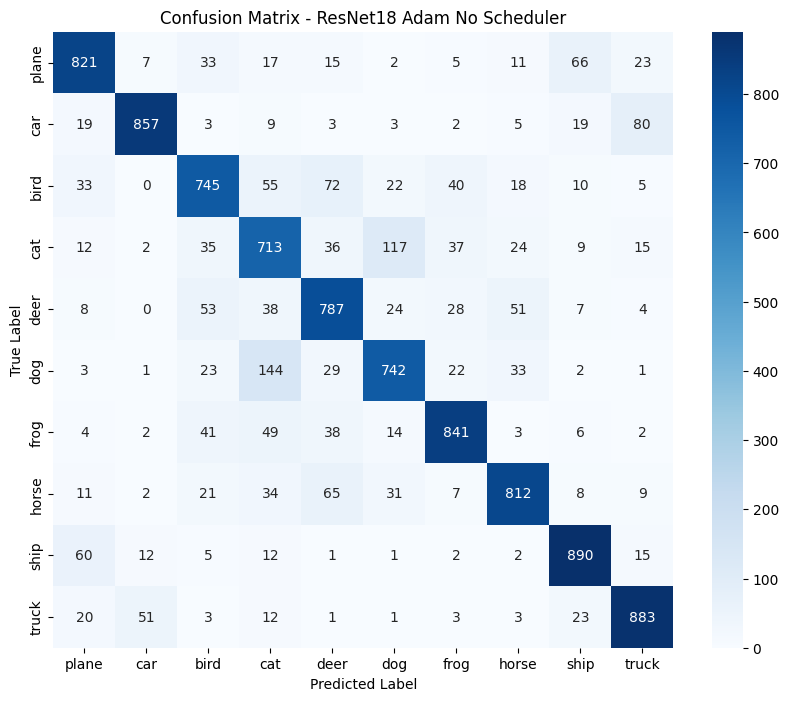

In [97]:
# Plot confusion matrix for model_10
plot_confusion_matrix(model_10, title='ResNet18 Adam No Scheduler', test_loader=testloader_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.41767126..1.5068768].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.39153773..1.5632443].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.4904547].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48209125..1.5632443].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4391681..1.0532508].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49473685..1.555192].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49

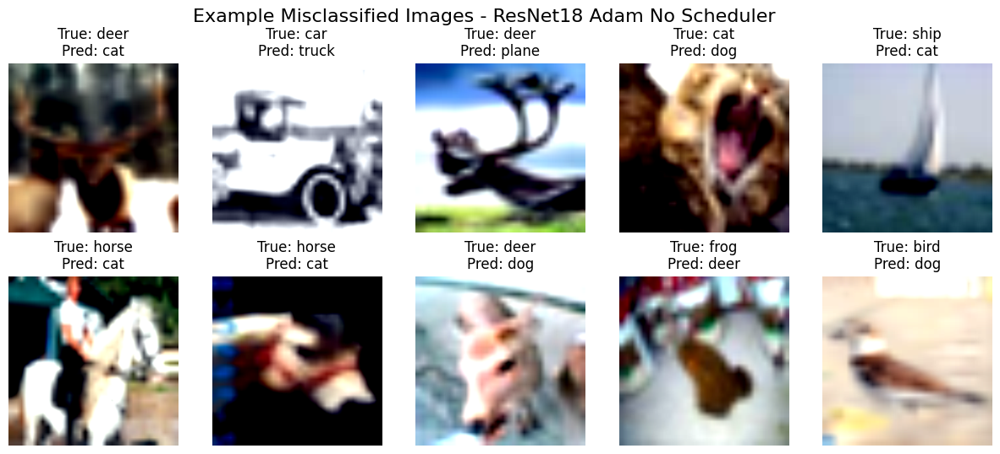

In [98]:
 # Plot misclassified images for model_10
plot_misclassified_images(model_10, title='ResNet18 Adam No Scheduler', test_loader=testloader_resnet, test_dataset=testset_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


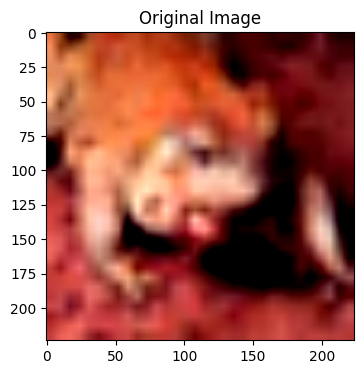

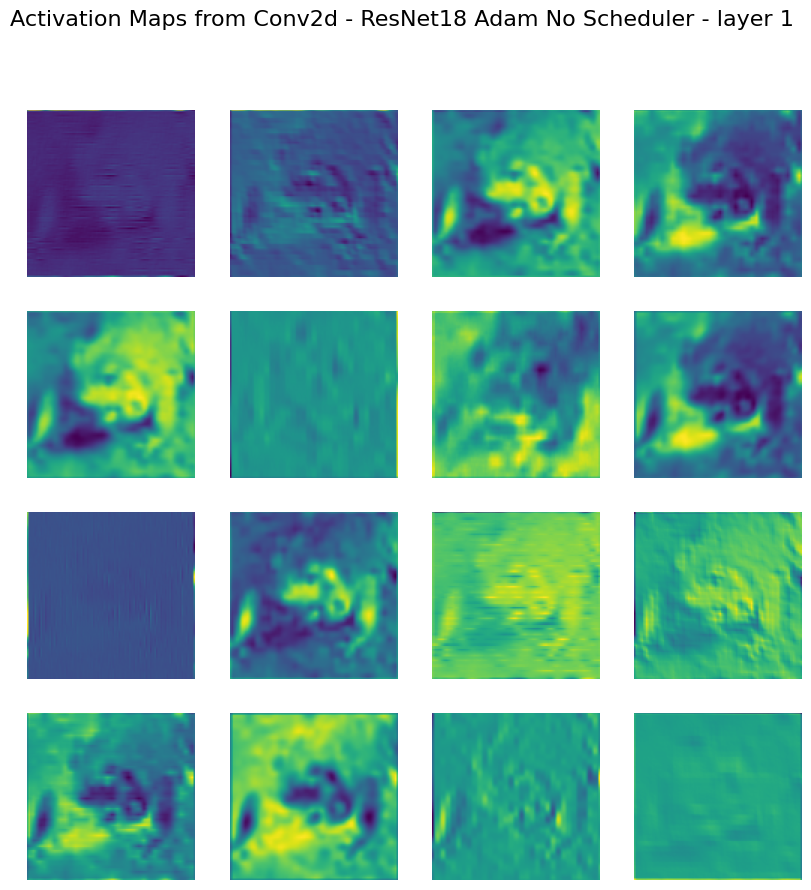

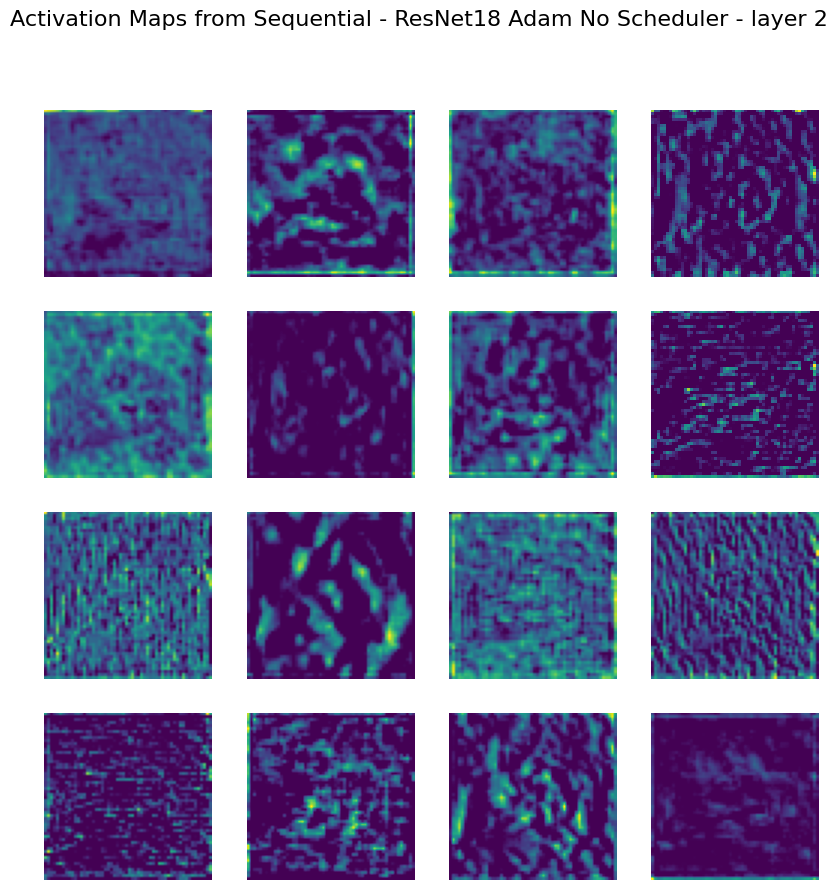

In [99]:
# Plot activation maps from the first two convolutional layer of model_10 comparing to original image
original_img, _ = testset_resnet[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_10, model_10.conv1, title='ResNet18 Adam No Scheduler - layer 1', test_dataset=testset_resnet)
plot_activation_maps(model_10, model_10.layer1, title='ResNet18 Adam No Scheduler - layer 2', test_dataset=testset_resnet)

In [100]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_10.eval()
with torch.no_grad():
    for inputs, labels in testloader_resnet:
        outputs = model_10(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.84      0.83      0.83      1000
         car       0.91      0.85      0.88      1000
        bird       0.78      0.76      0.77      1000
         cat       0.65      0.72      0.68      1000
        deer       0.76      0.80      0.78      1000
         dog       0.78      0.73      0.75      1000
        frog       0.85      0.83      0.84      1000
       horse       0.84      0.81      0.83      1000
        ship       0.85      0.89      0.87      1000
       truck       0.86      0.88      0.87      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



In [101]:
model_10_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

In [102]:
print(model_10_eval)

{'accuracy': 0.8098, 'precision': 0.8120185280267197, 'recall': 0.8098, 'f1_score': 0.810400523415725}


In [103]:
# Save the trained model
torch.save(model_10.state_dict(), './model_task1/custom_cnn_10.pth')


### 11. ResNet (Transfer Learning) + Adam + StepLR

In [104]:
model_11 = get_resnet18_model(device)
optimizer_11 = optim.Adam(model_11.fc.parameters(), lr=0.001)
scheduler_11 = lr_scheduler.StepLR(optimizer_11, step_size=7, gamma=0.1)

# Train and evaluate the model using the defined function with ResNet dataloaders (224x224 images)
model_11, history_11 = train_model(model_11, data_loaders_resnet, nn.CrossEntropyLoss(), optimizer_11, scheduler_11, num_epochs=EPOCHS)

Epoch 1/20
----------


c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


train Loss: 0.9290 Acc: 0.7070
val Loss: 0.6666 Acc: 0.7838
Epoch completed in 0m 45s

Epoch 2/20
----------
train Loss: 0.6351 Acc: 0.7852
val Loss: 0.6029 Acc: 0.7916
Epoch completed in 0m 45s

Epoch 3/20
----------
train Loss: 0.5934 Acc: 0.7967
val Loss: 0.5913 Acc: 0.7920
Epoch completed in 0m 45s

Epoch 4/20
----------
train Loss: 0.5785 Acc: 0.8002
val Loss: 0.5847 Acc: 0.8006
Epoch completed in 0m 45s

Epoch 5/20
----------
train Loss: 0.5614 Acc: 0.8064
val Loss: 0.5712 Acc: 0.8060
Epoch completed in 0m 45s

Epoch 6/20
----------
train Loss: 0.5550 Acc: 0.8061
val Loss: 0.5826 Acc: 0.8040
Epoch completed in 0m 45s

Epoch 7/20
----------
train Loss: 0.5513 Acc: 0.8100
val Loss: 0.5840 Acc: 0.7956
Epoch completed in 0m 45s

Epoch 8/20
----------
train Loss: 0.5301 Acc: 0.8163
val Loss: 0.5528 Acc: 0.8140
Epoch completed in 0m 45s

Epoch 9/20
----------
train Loss: 0.5300 Acc: 0.8144
val Loss: 0.5544 Acc: 0.8104
Epoch completed in 0m 45s

Epoch 10/20
----------
train Loss: 0.5325

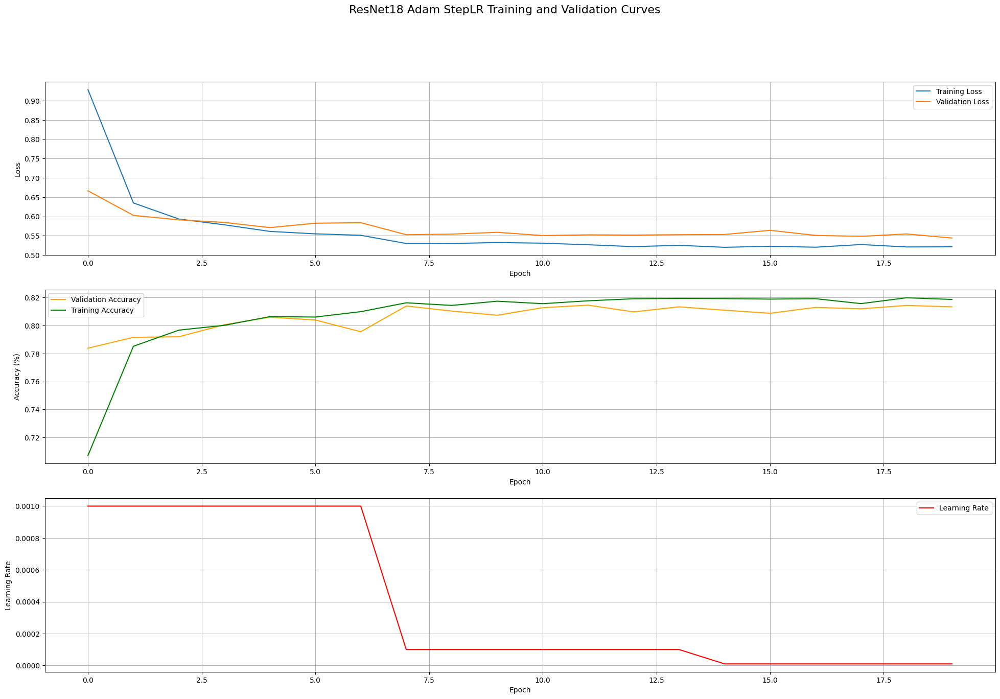

In [105]:
# Visualize training results for model_11
plot_curves(history_11, title='ResNet18 Adam StepLR Training and Validation Curves')

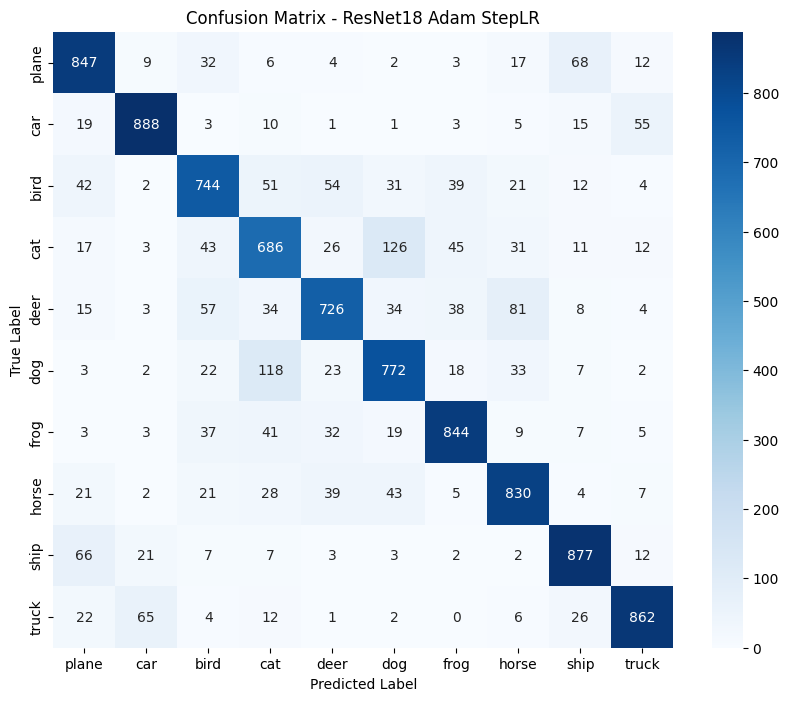

In [106]:
# Plot confusion matrix for model_11
plot_confusion_matrix(model_11, title='ResNet18 Adam StepLR', test_loader=testloader_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48679847..1.557913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22483134..1.4660475].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.40961874..1.4904547].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.41767126..1.5068768].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.4904547].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48209125..1.5632443].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4

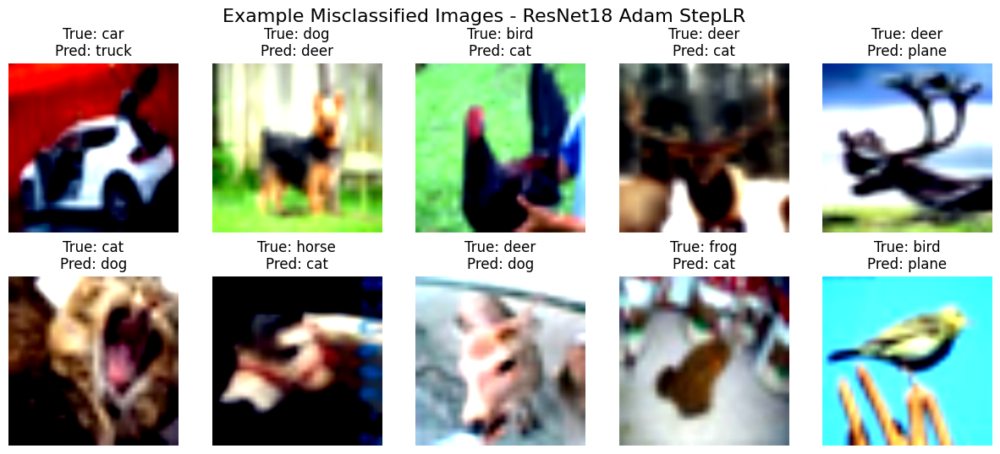

In [107]:
 # Plot misclassified images for model_11
plot_misclassified_images(model_11, title='ResNet18 Adam StepLR', test_loader=testloader_resnet, test_dataset=testset_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


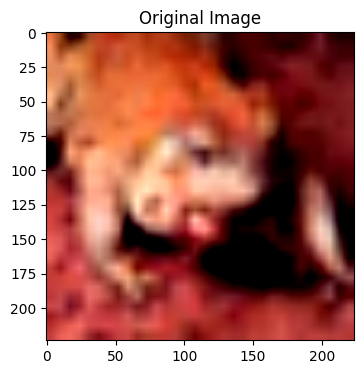

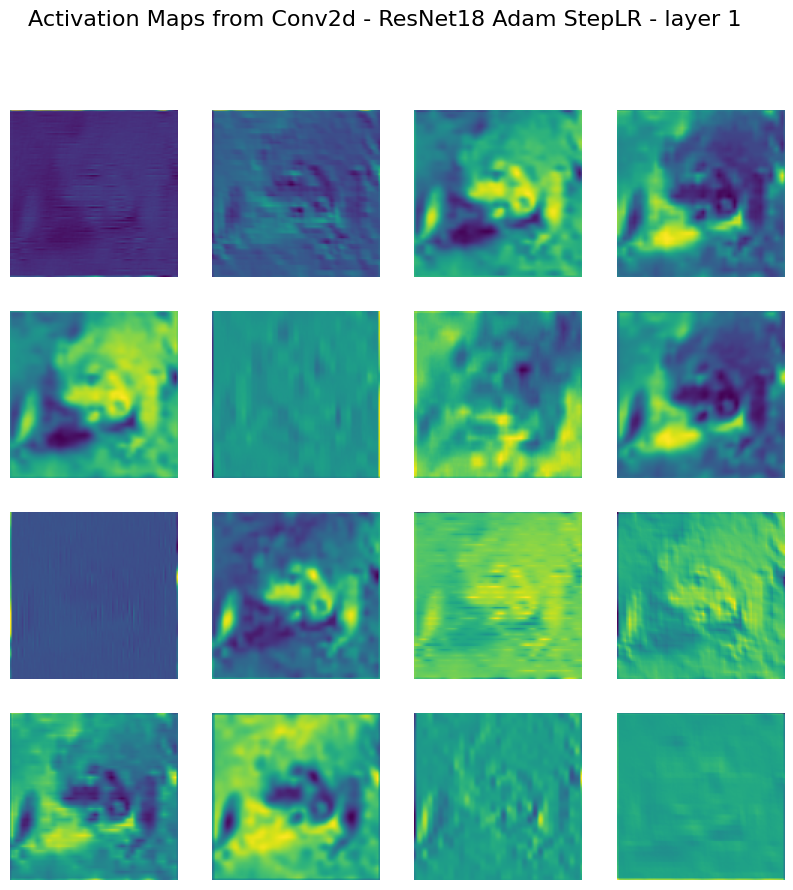

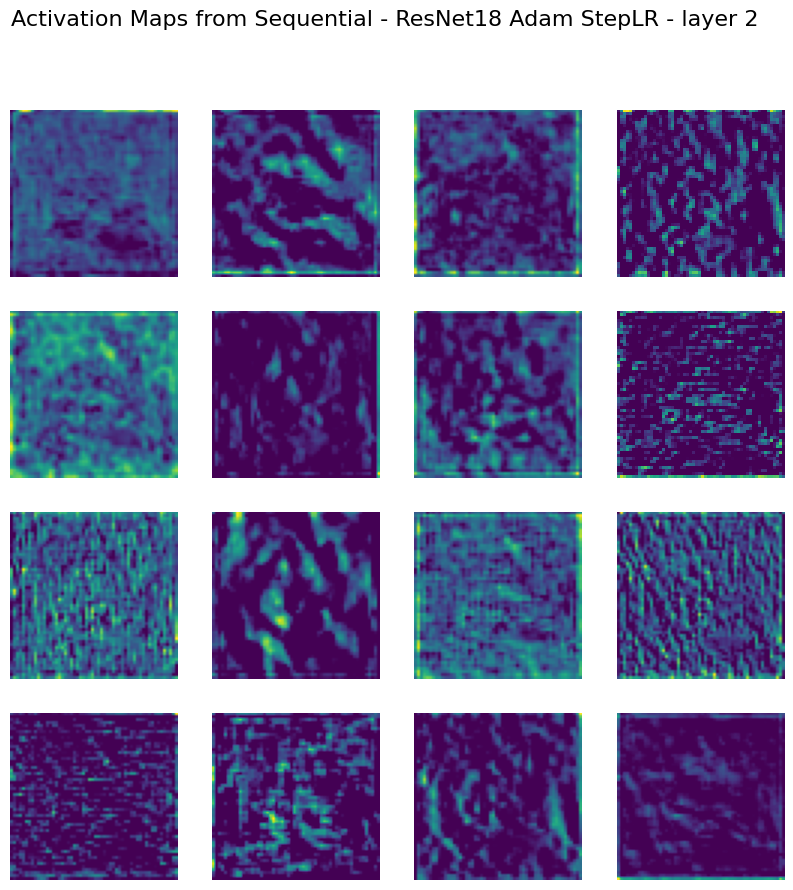

In [108]:
# Plot activation maps from the first two convolutional layer of model_11 comparing to original image
original_img, _ = testset_resnet[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_11, model_11.conv1, title='ResNet18 Adam StepLR - layer 1', test_dataset=testset_resnet)
plot_activation_maps(model_11, model_11.layer1, title='ResNet18 Adam StepLR - layer 2', test_dataset=testset_resnet)

In [109]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_11.eval()
with torch.no_grad():
    for inputs, labels in testloader_resnet:
        outputs = model_11(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.80      0.84      0.82      1000
         car       0.89      0.89      0.89      1000
        bird       0.77      0.75      0.76      1000
         cat       0.70      0.69      0.70      1000
        deer       0.78      0.74      0.76      1000
         dog       0.76      0.78      0.77      1000
        frog       0.85      0.84      0.85      1000
       horse       0.82      0.82      0.82      1000
        ship       0.84      0.88      0.86      1000
       truck       0.88      0.87      0.87      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



In [110]:
model_11_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

In [111]:
print(model_11_eval)

{'accuracy': 0.8095, 'precision': 0.8092165910939082, 'recall': 0.8095, 'f1_score': 0.809199965176249}


In [112]:
# Save the trained model
torch.save(model_11.state_dict(), './model_task1/custom_cnn_11.pth')


### 12. ResNet (Transfer Learning) + Adam + ReduceLROnPlateau

In [113]:
model_12 = get_resnet18_model(device)
optimizer_12 = optim.Adam(model_12.fc.parameters(), lr=0.001)
scheduler_12 = lr_scheduler.ReduceLROnPlateau(optimizer_12, 'min', patience=3)

# Train and evaluate the model using the defined function with ResNet dataloaders (224x224 images)
model_12, history_12 = train_model(model_12, data_loaders_resnet, nn.CrossEntropyLoss(), optimizer_12, scheduler_12, num_epochs=EPOCHS)

Epoch 1/20
----------


c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\USER\Documents\Dechathon_N\AIT\.venv\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


train Loss: 0.9226 Acc: 0.7114
val Loss: 0.6715 Acc: 0.7790
Epoch completed in 0m 45s

Epoch 2/20
----------
train Loss: 0.6336 Acc: 0.7853
val Loss: 0.6070 Acc: 0.7920
Epoch completed in 0m 45s

Epoch 3/20
----------
train Loss: 0.5928 Acc: 0.7974
val Loss: 0.5897 Acc: 0.7950
Epoch completed in 0m 45s

Epoch 4/20
----------
train Loss: 0.5773 Acc: 0.8002
val Loss: 0.5798 Acc: 0.8024
Epoch completed in 0m 45s

Epoch 5/20
----------
train Loss: 0.5675 Acc: 0.8046
val Loss: 0.5672 Acc: 0.8060
Epoch completed in 0m 45s

Epoch 6/20
----------
train Loss: 0.5586 Acc: 0.8071
val Loss: 0.5609 Acc: 0.8072
Epoch completed in 0m 45s

Epoch 7/20
----------
train Loss: 0.5484 Acc: 0.8088
val Loss: 0.5709 Acc: 0.8036
Epoch completed in 0m 45s

Epoch 8/20
----------
train Loss: 0.5480 Acc: 0.8102
val Loss: 0.5564 Acc: 0.8084
Epoch completed in 0m 45s

Epoch 9/20
----------
train Loss: 0.5442 Acc: 0.8108
val Loss: 0.5574 Acc: 0.8116
Epoch completed in 0m 45s

Epoch 10/20
----------
train Loss: 0.5410

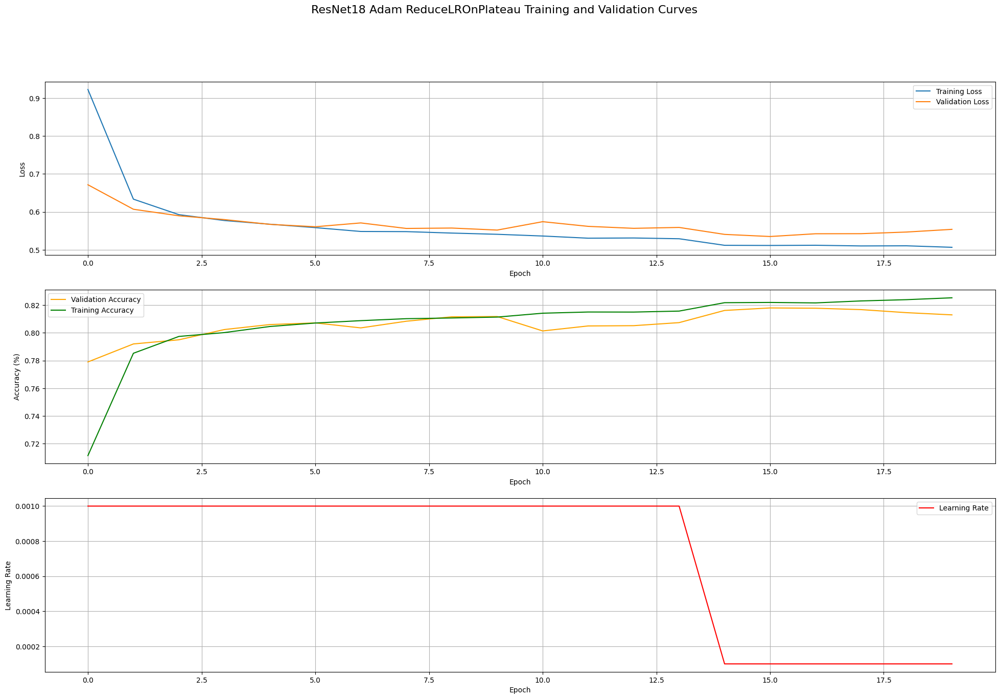

In [114]:
# Visualize training results for model12
plot_curves(history_12, title='ResNet18 Adam ReduceLROnPlateau Training and Validation Curves')

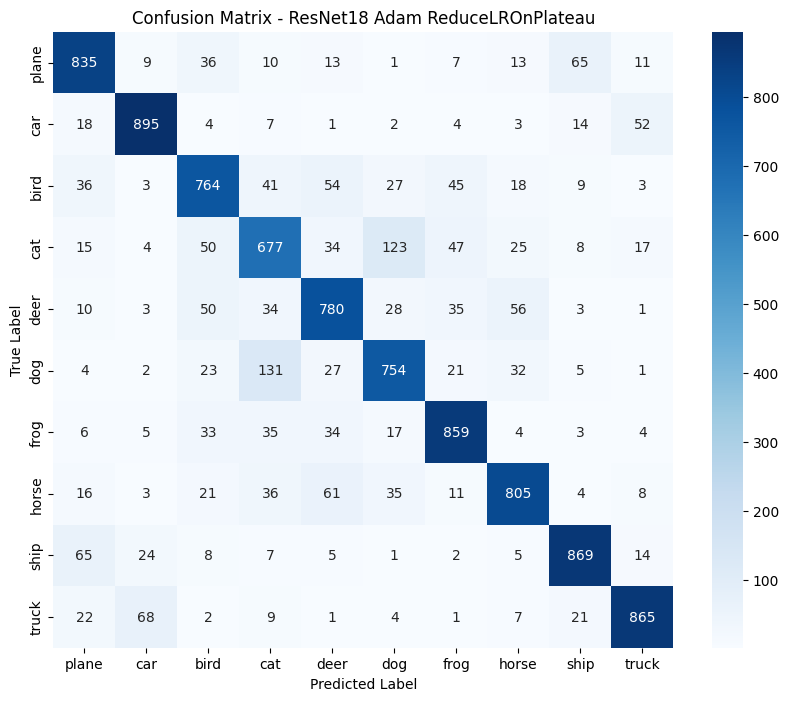

In [115]:
# Plot confusion matrix for model_12
plot_confusion_matrix(model_12, title='ResNet18 Adam ReduceLROnPlateau', test_loader=testloader_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.48679847..1.557913].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32803053..1.555192].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.32803053..1.1606592].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22483134..1.4660475].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.40961874..1.4904547].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.41767126..1.5068768].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22

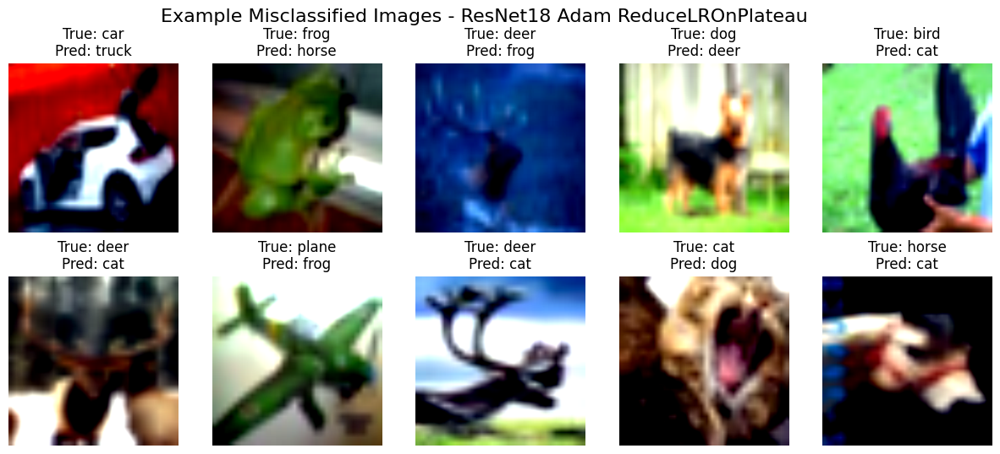

In [116]:
 # Plot misclassified images for model_12
plot_misclassified_images(model_12, title='ResNet18 Adam ReduceLROnPlateau', test_loader=testloader_resnet, test_dataset=testset_resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.45793372..1.1802652].


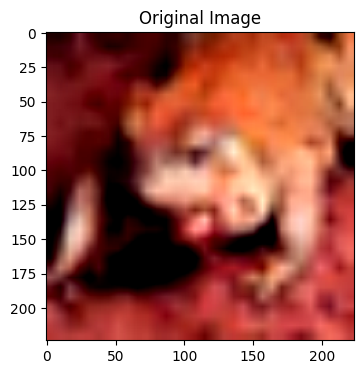

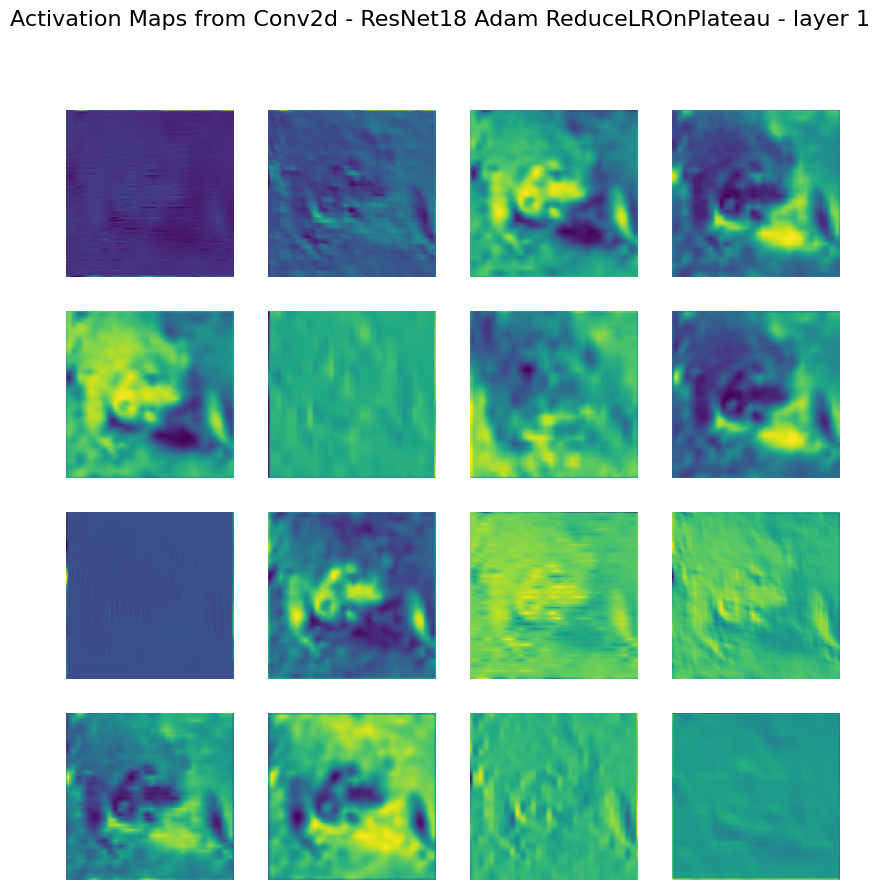

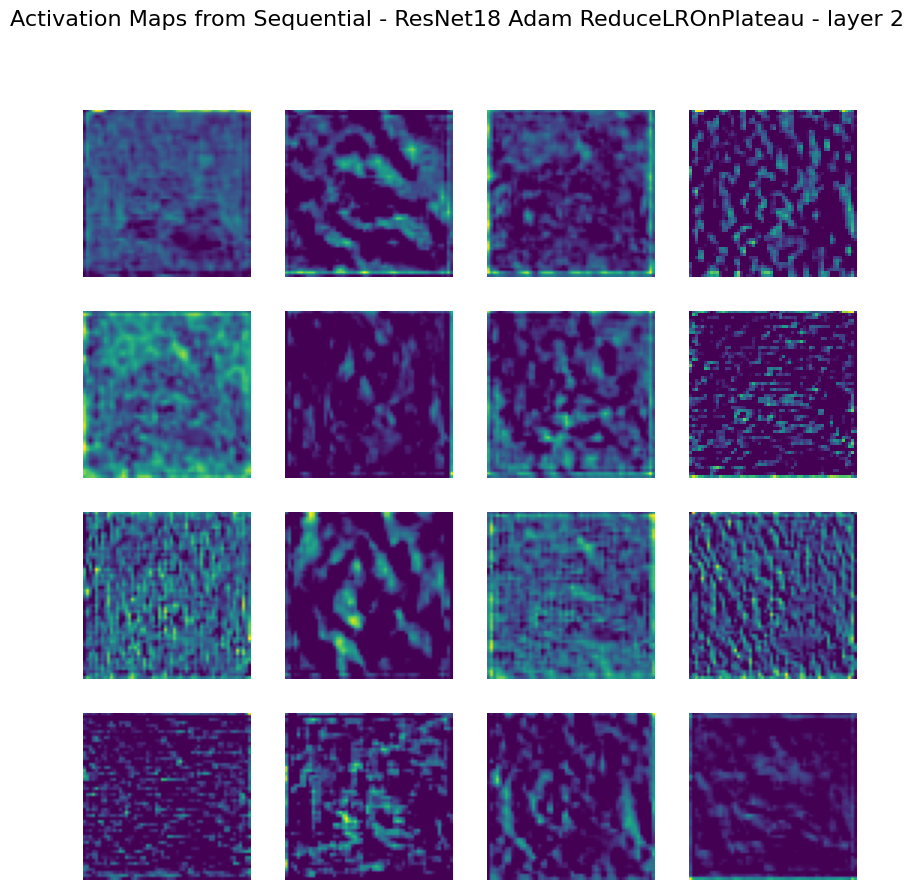

In [117]:
# Plot activation maps from the first two convolutional layer of model_12 comparing to original image
original_img, _ = testset_resnet[5]
plt.figure(figsize=(4,4))
plt.imshow(np.transpose(original_img.numpy() / 2 + 0.5, (1, 2, 0)))
plt.title('Original Image')
plot_activation_maps(model_12, model_12.conv1, title='ResNet18 Adam ReduceLROnPlateau - layer 1', test_dataset=testset_resnet)
plot_activation_maps(model_12, model_12.layer1, title='ResNet18 Adam ReduceLROnPlateau - layer 2', test_dataset=testset_resnet)

In [118]:
# Classification report of the model
from sklearn.metrics import classification_report
y_pred, y_true = [], []
model_12.eval()
with torch.no_grad():
    for inputs, labels in testloader_resnet:
        outputs = model_12(inputs.to(device))
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.cpu().numpy())
        y_true.extend(labels.cpu().numpy())
print(classification_report(y_true, y_pred, target_names=classes))

              precision    recall  f1-score   support

       plane       0.81      0.83      0.82      1000
         car       0.88      0.89      0.89      1000
        bird       0.76      0.76      0.76      1000
         cat       0.69      0.67      0.68      1000
        deer       0.76      0.77      0.77      1000
         dog       0.76      0.75      0.75      1000
        frog       0.84      0.86      0.85      1000
       horse       0.83      0.82      0.82      1000
        ship       0.87      0.88      0.87      1000
       truck       0.89      0.87      0.88      1000

    accuracy                           0.81     10000
   macro avg       0.81      0.81      0.81     10000
weighted avg       0.81      0.81      0.81     10000



In [119]:
model_12_eval = {'accuracy': sklearn.metrics.accuracy_score(y_true, y_pred),
                'precision': sklearn.metrics.precision_score(y_true, y_pred, average='weighted'),
                'recall': sklearn.metrics.recall_score(y_true, y_pred, average='weighted'),
                'f1_score': sklearn.metrics.f1_score(y_true, y_pred, average='weighted')}

In [120]:
print(model_12_eval)

{'accuracy': 0.8093, 'precision': 0.8088806777891172, 'recall': 0.8093, 'f1_score': 0.8090321327122495}


In [121]:
# Save the trained model
torch.save(model_12.state_dict(), './model_task1/custom_cnn_12.pth')


## Evaluate the result

In [122]:
# Create DataFrame to compare model evaluations

model_evaluations = pd.DataFrame({
    'Custom CNN SGD No Scheduler': model_1_eval,
    'Custom CNN SGD StepLR': model_2_eval,
    'Custom CNN SGD ReduceLROnPlateau': model_3_eval,
    'Custom CNN Adam No Scheduler': model_4_eval,
    'Custom CNN Adam StepLR': model_5_eval,
    'Custom CNN Adam ReduceLROnPlateau': model_6_eval,
    'ResNet18 SGD No Scheduler': model_7_eval,
    'ResNet18 SGD StepLR': model_8_eval,
    'ResNet18 SGD ReduceLROnPlateau': model_9_eval,
    'ResNet18 Adam No Scheduler': model_10_eval,
    'ResNet18 Adam StepLR': model_11_eval,
    'ResNet18 Adam ReduceLROnPlateau': model_12_eval
})
model_evaluations.T.sort_values(by='accuracy', ascending=False)

,accuracy,precision,recall,f1_score
ResNet18 Adam No Scheduler,0.8098,0.812019,0.8098,0.810401
ResNet18 Adam StepLR,0.8095,0.809217,0.8095,0.809200
ResNet18 Adam ReduceLROnPlateau,0.8093,0.808881,0.8093,0.809032
Custom CNN Adam ReduceLROnPlateau,0.8065,0.806574,0.8065,0.806502
Custom CNN Adam No Scheduler,0.8052,0.805636,0.8052,0.804940
Custom CNN Adam StepLR,0.7982,0.797729,0.7982,0.797816
ResNet18 SGD ReduceLROnPlateau,0.7688,0.768437,0.7688,0.768367
ResNet18 SGD No Scheduler,0.7635,0.763792,0.7635,0.763190
ResNet18 SGD StepLR,0.7448,0.744887,0.7448,0.744265
Custom CNN SGD No Scheduler,0.3559,0.346210,0.3559,0.331926


## Short discussion comparing performance and convergence behavior